### Автор: Черная Анастасия


### Telegram: @ChernayaAnastasia

# Подготовка данных к обучению модели (аугментация и спеллчекинг)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import torch
import re
import json
from tqdm import tqdm
import requests
import time
from wordcloud import WordCloud

PATH_COLAB = '/content/drive/MyDrive/Colab Notebooks/DLS_EcomTech_Workshop/competition/'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [2]:
url_train = 'https://drive.google.com/uc?id=1Ea22Qm0llAHiuZ-kp9ly115LgdQnlrB8'
url_test = 'https://drive.google.com/uc?id=19gzNsgS3ako_-r7eaozjGF5jrmJNvtD4'
url_trends = 'https://drive.google.com/uc?id=1aonE9HI49D9Hgu-jSe5DVVma8qZ8HYqj'

In [3]:
train_data = pd.read_csv(url_train, index_col=0)
test_data = pd.read_csv(url_test)
trends = pd.read_csv(url_trends)
train_data.head()

,index,assessment,tags,text,trend_id_res0,trend_id_res1,trend_id_res2,trend_id_res3,trend_id_res4,trend_id_res5,...,trend_id_res40,trend_id_res41,trend_id_res42,trend_id_res43,trend_id_res44,trend_id_res45,trend_id_res46,trend_id_res47,trend_id_res48,trend_id_res49
0,5652,6.0,"{ASSORTMENT,PROMOTIONS,DELIVERY}","Маленький выбор товаров, хотелось бы ассортиме...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,18092,4.0,"{ASSORTMENT,PRICE,PRODUCTS_QUALITY,DELIVERY}",Быстро,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,13845,6.0,"{DELIVERY,PROMOTIONS,PRICE,ASSORTMENT,SUPPORT}",Доставка постоянно задерживается,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,25060,6.0,"{PRICE,PROMOTIONS,ASSORTMENT}",Наценка и ассортимент расстраивают,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1428,6.0,"{PRICE,PROMOTIONS}",Можно немного скинуть минимальную сумму заказа...,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# EDA исходных данных

In [4]:
train_data.text.isna().sum()

0

In [5]:
targets_list = [col for col in train_data.columns if col.startswith('trend_id_res')]
targets_list[:5]

['trend_id_res0',
 'trend_id_res1',
 'trend_id_res2',
 'trend_id_res3',
 'trend_id_res4']

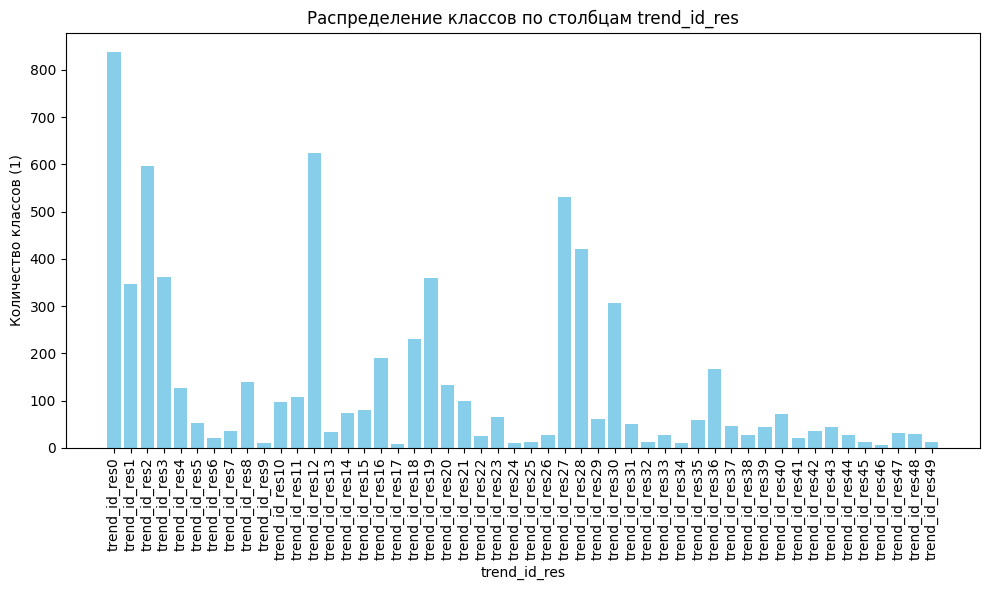

In [6]:
class_sums = train_data[targets_list].sum()

plt.figure(figsize=(10, 6))
plt.bar(class_sums.index, class_sums.values, color='skyblue')
plt.xticks(rotation=90)
plt.xlabel('trend_id_res')
plt.ylabel('Количество классов (1)')
plt.title('Распределение классов по столбцам trend_id_res')
plt.tight_layout()
plt.show()

In [7]:
train_data.describe().T.sort_values(by='mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
index,4623.0,16028.603721,8586.721751,0.0,8220.5,19025.0,23417.0,27035.0
assessment,4623.0,3.289206,2.163499,0.0,2.0,3.0,6.0,6.0
trend_id_res0,4623.0,0.181051,0.385102,0.0,0.0,0.0,0.0,1.0
trend_id_res12,4623.0,0.134977,0.341736,0.0,0.0,0.0,0.0,1.0
trend_id_res2,4623.0,0.129137,0.335388,0.0,0.0,0.0,0.0,1.0
trend_id_res27,4623.0,0.114644,0.318626,0.0,0.0,0.0,0.0,1.0
trend_id_res28,4623.0,0.090850,0.287427,0.0,0.0,0.0,0.0,1.0
trend_id_res3,4623.0,0.078088,0.268339,0.0,0.0,0.0,0.0,1.0
trend_id_res19,4623.0,0.077872,0.267998,0.0,0.0,0.0,0.0,1.0
trend_id_res1,4623.0,0.075059,0.263516,0.0,0.0,0.0,0.0,1.0


Из данных, представленных в таблице, можно сделать следующие выводы о встречаемости тем:

Большинство тем крайне редки. Средние значения для большинства столбцов trend_id_resNUMBER находятся в диапазоне от 0.001 до 0.18. Это означает, что лишь небольшая доля примеров в датасете содержит единицы для каждой из этих тем. Для некоторых тем, таких как trend_id_res0 (0.181), это встречаемость 18%, а для большинства остальных встречаемость составляет значительно меньше 10%.

Темы с более высокой встречаемостью:

* trend_id_res0 (долгая доставка) — 18.1%
* trend_id_res12(высокие цены) — 13.5%
* trend_id_res2 (Время доставки не соответствует заявленому) — 12.9%
* trend_id_res27(Качество товаров) — 11.5%

Это означает, что эти темы встречаются чаще, чем остальные.

Редкие темы. Множество тем встречаются крайне редко, их среднее значение составляет менее 1%. Например, такие темы, как

* trend_id_res46(время работы) (0.15%) и
* trend_id_res17 (не читаем комментарии) (0.19%)
встречаются очень редко в выборке.

Итог:

В датасете наблюдается сильный дисбаланс классов. Некоторые темы встречаются чаще, чем другие, но большинство тем встречаются крайне редко, что говорит о несбалансированности данных. Это может усложнить обучение модели, так как она будет склонна предсказывать более часто встречающиеся темы и игнорировать редкие.

## Облако слов для каждого тренда как есть, без лемматизации

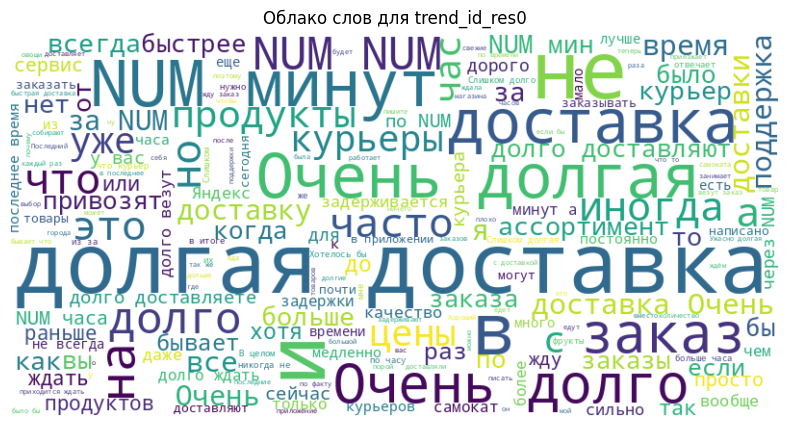

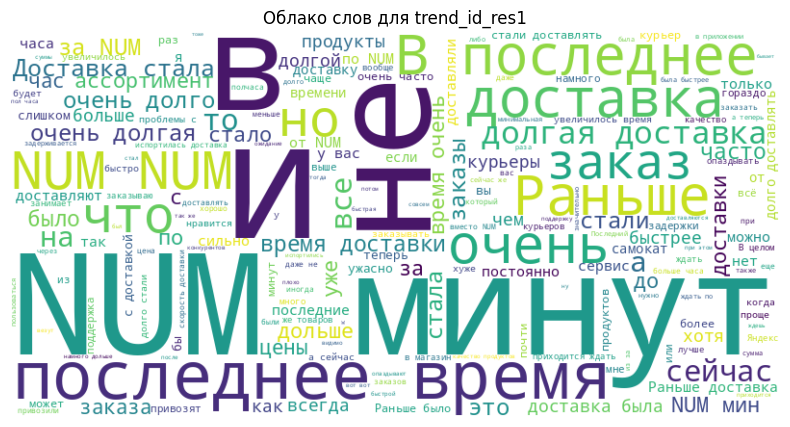

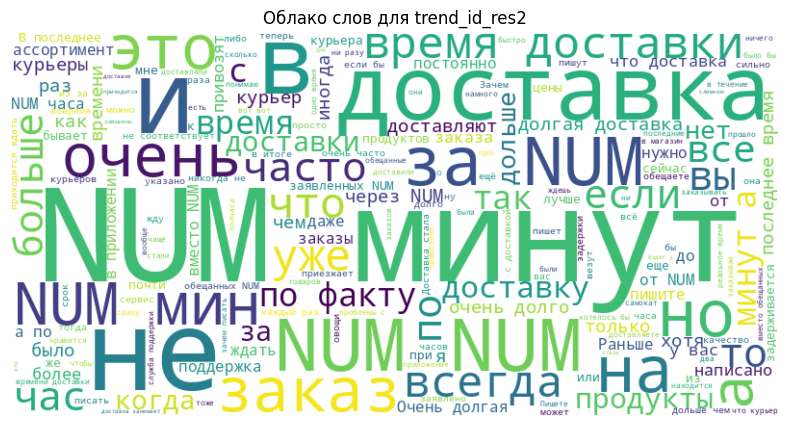

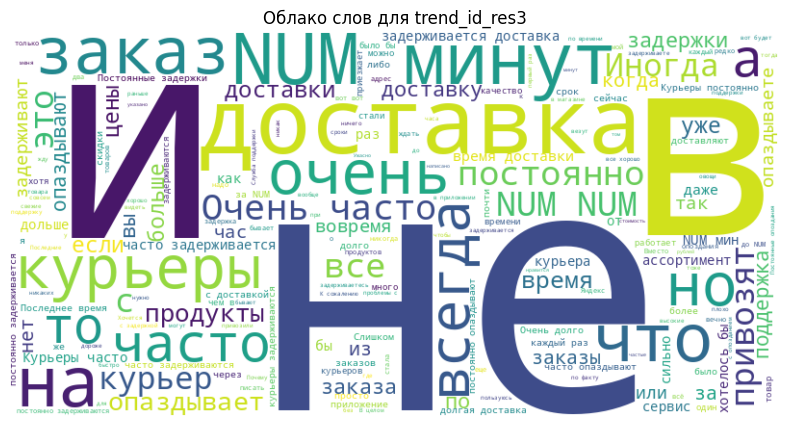

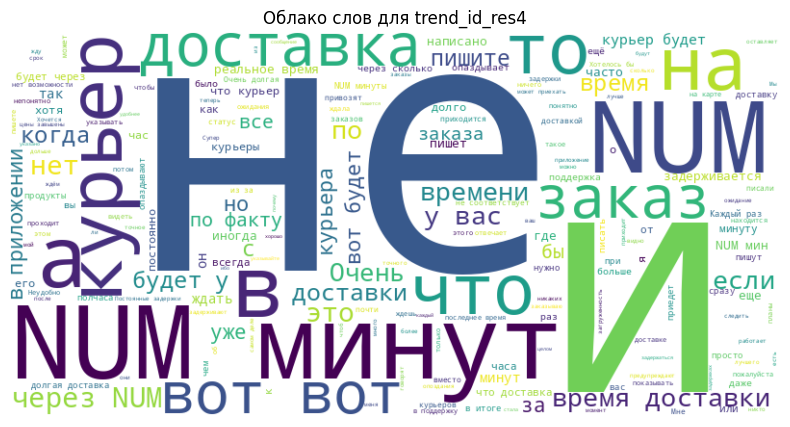

...

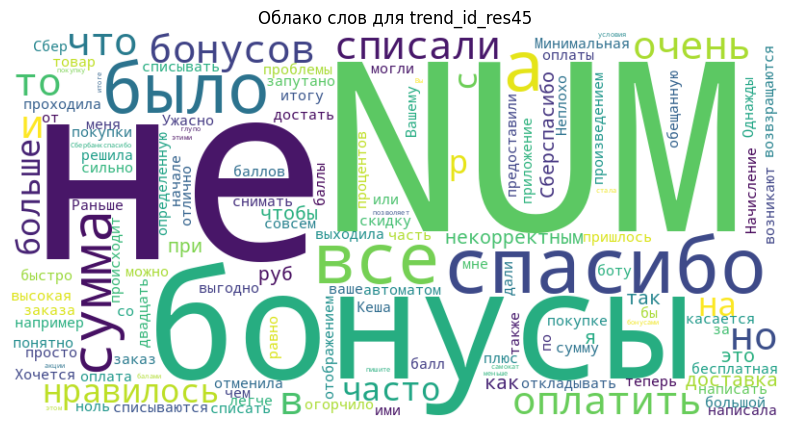

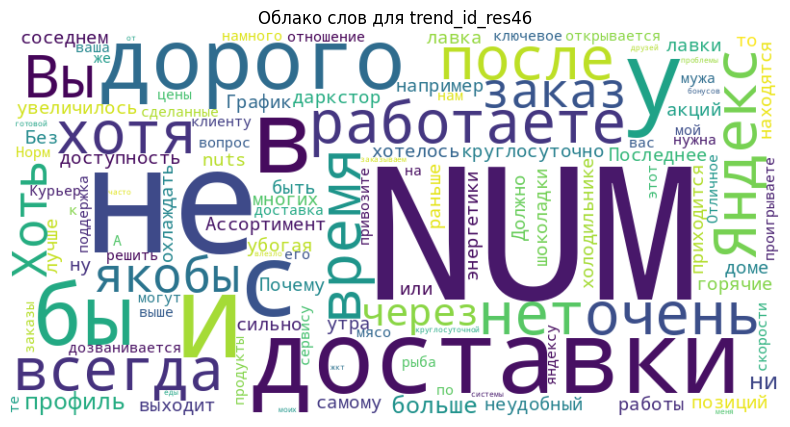

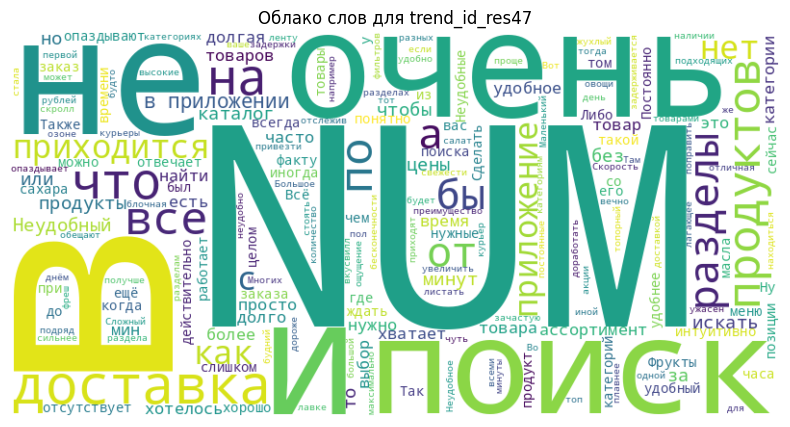

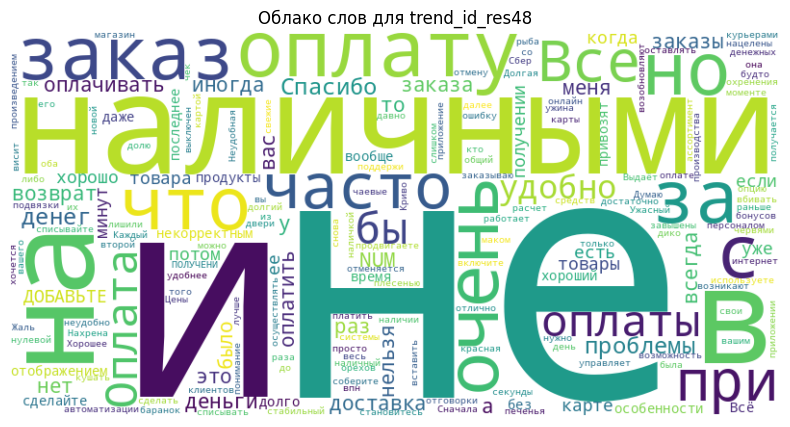

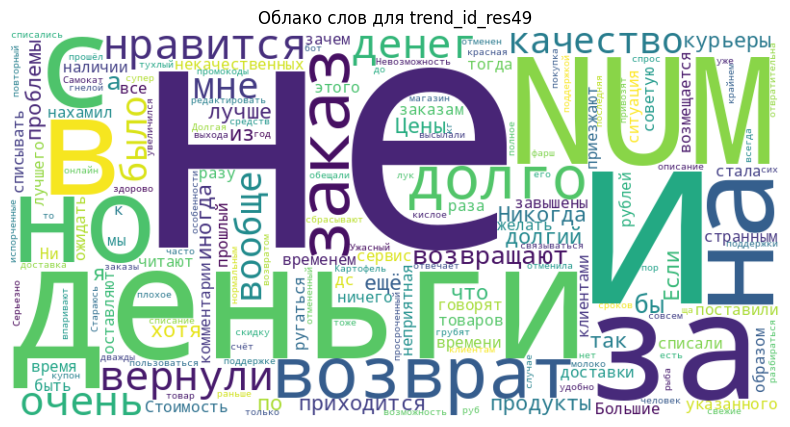

In [8]:
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()


for i in range(50):  # Для каждого trend_id_res от 0 до 49
    trend_texts = train_data[train_data[f'trend_id_res{i}'] == 1]['text']

    # Объединяем все строки в один текст
    combined_text = " ".join(trend_texts)

    # Строим облако слов для данного класса
    generate_wordcloud(combined_text, f'Облако слов для trend_id_res{i}')

Беглое изучение облака слов говорит о том, что некоторые темы будут трудно различимы, к примеру первые четыре, где речь идет про доставку:

0 0 Долгая доставка

1 1 Доставка стала долгой

2 2 Время доставки не соответствует заявленому

3 3 Регулярные опоздания

Чтобы учесть тонкие различия между этими темами, нужно брать в анализ весь контекст. С этим плохо справятся простые статистические методы типа tf-idf.

А также сильно пересекаются темы "Спасибо" и "Все нормально". И скорее всего, есть ошибки в разметке по темам "Нет смысла" ("обращения смысл, которых не ясен или его нет") и "Все плохо" (негативные комментарии без конкретики), поскольку есть сообщения лишь с негативной (оскорбительной) лексикой, без конкретики, хотя смысл вполне себе присутствует: человек недоволен сервисом - и разметчики тут путают классы 19 и  21. (к примеру, train_data.loc[5865], train_data.loc[301], train_data.loc[88], train_data.loc[4665]).

# Правка разметки в исходном датасете

Ошибки в разметке замечены в том числе в ходе работы над генерацией новых данных с помощью ChatGPT. Весь поиск ошибок сюда не включаю, чтобы не засорять тетрадку.  
В целом скажу, что исходная разметка требует проверки.

Путают тренды, к примеру:

- 17 ('не читаем комментарии') и 16 ('замечания по работе курьеров'):  когда речь идет о том, что курьеры не читают комментарии - относят к 17, а не к 16.

- 41 ('Не нравится интерфейс приложения') и 47 ('неудобный поиск')

- Довольно много упоминаний конкурентов (тренд 36) не отражено. Однако я в итоге не стала править этот момент - подозреваю, в данных для теста та же история (у меня немного упало качество на leaderboard после этой правки).

In [9]:
# Фильтр для строк с ключевыми словами-названиями конкурентов
mask = train_data['text'].str.contains(r'[Яя]нде|[Вв]кус ?[Вв]ил|Лавк|[Оо]зон|[СсCc]бермарк|[Дд][еи]ливер|[Пп]ерекр[её]стк|[Пп]ят[её]рочк|[Мм]агнит|Лент', na=False)


# Проверяем, что в столбце 'trend_id_res36' не стоит значение 1
indices_missing_36 = train_data[mask & (train_data['trend_id_res36'] != 1)].index

In [10]:
indices_missing_36

Index([   5,  130,  349,  435,  443,  510,  932, 1277, 1688, 2625, 2631, 2739,
       2744, 2774, 3308, 3804, 4007, 4108, 4206, 4533, 4945, 5989, 6663, 7125,
       7308, 7379, 7455, 7778, 7971, 8060, 8531],
      dtype='int64')

In [11]:
train_data.loc[130][['text', 'trend_id_res13']]

,130
text,"Цены выше ,чем в Яндекс маркете ,но можно опла..."
trend_id_res13,0


In [12]:
indices_17_instead_16 = [328, 1661, 2530, 4962]
indices_24_instead_26 = [2999]
indices_41_instead_47 = [942, 2091, 5610]
indices_39_not_relevant  = [6854, 6673]
train_data.loc[indices_17_instead_16, 'trend_id_res17'] = 0
train_data.loc[indices_17_instead_16, 'trend_id_res16'] = 1
train_data.loc[indices_24_instead_26, 'trend_id_res24'] = 0
train_data.loc[indices_24_instead_26, 'trend_id_res26'] = 1
train_data.loc[indices_41_instead_47, 'trend_id_res41'] = 0
train_data.loc[indices_41_instead_47, 'trend_id_res47'] = 1
train_data.loc[indices_39_not_relevant, 'trend_id_res39'] = 0
#train_data.loc[indices_missing_36, 'trend_id_res36'] = 1

# Аугментация данных с помощью ChatGPT

Я использовала GPT-4o mini, диалоговое окно в браузере, поскольку для APi нужен доступ к платной версии, в бесплатной - ограничение на кол-во токенов.

In [13]:
# порог в 1% для метки 1
threshold = 0.01
total_rows = len(train_data)
to_add_dict = {}

for col in targets_list:
    # подсчет количества меток 1 в каждом столбце
    count_ones = train_data[col].sum()

    # процент меток 1
    percentage = count_ones / total_rows

    # если процент меньше 1%, считаю недостающее количество
    if percentage < threshold:
        needed_count = int(total_rows * threshold - count_ones)
        to_add_dict[col] = needed_count
    else:
        to_add_dict[col] = 0

Список тем для аугментации + кол-во примеров по каждой теме, чтобы в датасете для обучения кол-во таких тем выросло до 1%

In [14]:
df = pd.DataFrame(list(to_add_dict.items()), columns=['Key', 'Value'])
trends_to_augment = df[df['Value'] > 0].sort_values(by='Value', ascending=False)

Список тем для аугментации

In [15]:
trends[trends['trend_id'].isin(list(trends_to_augment.Key.index))]['trend']

,trend
6,Нет доставки по адресу
7,Не предупреждаем об удалении товара
9,Сумма заказа меняется во время набора корзины
13,Не довезли товар
17,Не читаем комментарии
22,Скидки для постоянных клиентов
24,Скидка/промокод распространяется не на все товары
25,Непонятно как работает скидка
26,Не сработала скидка/акция/промокод
32,Отменили заказ


In [16]:
print('Количество тем для аугментации:', len(trends_to_augment))

Количество тем для аугментации: 23


In [17]:
reviews_to_augment_dict = {}

for index, row in trends_to_augment.iterrows():
    trend_key = row['Key']  # техническое название тренда
    count = row['Value']     # количество примеров
    trend_name = trends[trends['trend_id']==index]['trend'] # название темы из trends
    trend_explanation = trends.loc[trends['trend_id'] == index, 'explanation'].values[0] # комментарий к теме

    if not trend_name.empty:
        trend_name = trend_name.values[0]
    else:
        trend_name = f"Unknown Trend {trend_key}"

    #отзывы для данной темы
    examples = train_data[train_data[trend_key] == 1]['text'].tolist()

    reviews_to_augment_dict[trend_name] = {
            "trend_id": trend_key,
            "count": count,
            "explanation": trend_explanation,
            "examples": examples,
        }

In [18]:
#import json
#with open(os.path.join(PATH_COLAB, "reviews_to_augment.json"), 'w', encoding='utf-8') as json_file:
#    json.dump(reviews_to_augment_dict, json_file, ensure_ascii=False, indent=4)

## Автоматазиция генерации промта для разных трендов.

Это грубоватое решение, поскольку отзыв может относиться сразу к нескольким классам.

Я попыталась составить промт так, чтобы ответы ChatGPT не касались других тем, но все равно по некоторым трендам отзывы пересекаются с другими. Это грубое решение, поскольку я была ограничена во времени, при этом хотелось в целом посмотреть, как это работает и есть ли улучшение. Порог для объема аугментированных данных тоже выбран небольшой, для эксперимента.  

In [19]:
# Основной промт
base_prompt = (
    'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет '
    'по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "{class_name}". '
    'Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами '
    'разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты '
    'питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит '
    'заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры '
    'отзывов для этого класса:\n'
)

# Добавление требований с подстановкой названия класса и описанием
def get_requirements(class_name, trend_explanation, count, trend_id):
    return (
        "\n**Требования:**\n"
        f"- Сосредоточься на описании проблемы '{class_name}'. Вот описание сути класса: '{trend_explanation}'.\n"
        "- Постарайся сделать отзывы реалистичными и детализированным и разнообразными\n"
        "- Каждый отзыв на отдельной строке и в кавычках.\n"
        "- Указание на время, сумму или количество замени на [NUM].\n"
        f"- Сгенерируй {count} отзывов.\n"
        f'- Верни результат в виде списка с названием reviews_{trend_id}.\n'
        "- Ничего не выдумывай, опирайся только на предоставленные данные.\n\n"
        "Я дам тебе чаевые $200 за хорошие отзывы, это очень важная для меня задача.\n"
    )

# Генерация отзывов
def generate_reviews(reviews_to_augment_dict):
    reviews_to_augment_list = []
    for class_name, details in reviews_to_augment_dict.items():
        count = details['count']
        examples = details['examples']
        trend_explanation = details['explanation']
        trend_id = details['trend_id']
        prompt = base_prompt.format(class_name=class_name)

        # Добавление примеров отзывов
        prompt += "\n".join(f'"{review}"' for review in examples)

        # Добавление требований с подстановкой класса, описания и количества
        prompt += get_requirements(class_name, trend_explanation, count, trend_id)
        reviews_to_augment_list.append(prompt)

    return(reviews_to_augment_list)

In [20]:
reviews_to_augment_list = generate_reviews(reviews_to_augment_dict)

Генерируем отзыв

In [21]:
reviews_to_augment_list[0]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не читаем комментарии". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Постоянные опозд-я,отсутсв.клиент-ти.На замеч.не класть карт-ку с землей в общий пакет с прод. не реагируют.Кл-ты моют прод-ты от земли. Всем плевать на жалобы,отписки по шаблону.Вкусвилл везёт прод. столько же,цены адекватнее,клиент-ть на высоте.👎🏻👎🏻"\n"Я думаю вы компания обманщиков, так как регулярная цена ничем не отличается от цены со скидкой. Вы кого обмануть пытаетесь???? А ещё мне ни разу не привезли сегодняшний хлеб, он всег

Ответ GPT-4o mini

In [22]:
reviews_trend_id_res17 = [
    "Постоянно прошу не класть яйца с тяжёлыми продуктами, но комментарий всегда игнорируют. В этот раз яйца все разбились, что за халатность?",
    "Написала, чтобы не заменяли определённые товары, если их нет в наличии, но снова проигнорировали. В итоге мне привезли совсем не то, что я заказывала!",
    "В комментарии указала, чтобы не клали замороженные продукты вместе с другими, но как всегда — всё в одной куче. Кто-то читает вообще, что пишут?",
    "В комментариях всегда прошу, чтобы йогурты были свежими, но снова привезли на грани истечения срока. Это вообще издевательство?",
    "Каждый раз пишу, чтобы мясо клали в отдельный пакет, но как обычно, его положили с фруктами. Когда уже начнут читать комментарии?",
    "Постоянно прошу не класть хлеб с замороженными продуктами, но каждый раз комментарии игнорируются. Хлеб всегда мокрый и несвежий.",
    "В комментарии указала, что у меня аллергия на орехи, но в заказе опять есть продукты с орехами. Это может быть опасно!",
    "В третий раз прошу не класть молочные продукты с другими товарами. Комментарий опять не прочитали — всё в одной куче.",
    "Попросила, чтобы хлеб был свежим, а не вчерашним. Но как всегда, комментарии никто не читал, и мне снова привезли старый хлеб.",
    "Указал, чтобы не заменяли заказ без моего согласия. Естественно, никто не прочитал, и в итоге я получила продукты, которые мне не нужны.",
    "Каждый раз прошу не класть тяжёлые товары на хлеб, но комментарии снова проигнорировали. В итоге хлеб снова испорчен.",
    "Писала, чтобы салаты упаковывали отдельно от замороженных продуктов, но опять всё свалили вместе. Никто не читает комментарии?",
    "Постоянно прошу не класть молочные продукты с другими товарами. Как обычно, никто не прочитал — всё перемешали.",
    "Просил, чтобы не заменяли мясо без моего согласия, но снова получил продукт, который мне не нужен. Похоже, комментарии никто не читает.",
    "Прошу не заменять продукты без предварительного согласования, но снова привезли замену без моего ведома. Никто не обращает внимания на комментарии.",
    "Уже не в первый раз прошу не класть молочные продукты с тяжёлыми товарами. Как всегда, комментарии никто не читал.",
    "В комментариях указала, чтобы не клали овощи с консервами, но всё равно привезли в одном пакете. Что за отношение к клиентам?",
    "Постоянно пишу, чтобы молочные продукты упаковывали отдельно от других, но это, похоже, никто не читает — снова всё вместе.",
    "Просил, чтобы свежие овощи не заменяли на товары с истекающим сроком годности. Как обычно, комментарий проигнорировали.",
    "Пишу каждый раз, чтобы хлеб упаковывали отдельно от замороженных продуктов, но снова привезли всё в одной упаковке.",
    "Попросила, чтобы не заменяли товар без моего согласия, но опять никто не прочитал комментарий — привезли замену без согласования.",
    "Указал в комментариях, что не нужно класть скоропортящиеся продукты с замороженными, но снова проигнорировали — всё свалили вместе.",
    "Постоянно прошу не класть овощи с консервами, но комментарии никто не читает. В итоге овощи помяты и испорчены.",
    "В комментариях указала, чтобы не клали скоропортящиеся продукты вместе с замороженными, но всё равно их сложили в один пакет.",
    "Написала, чтобы не заменяли продукты без моего согласия. Как обычно, комментарии проигнорировали — привезли не то, что я заказывала.",
    "Прошу не класть хлеб с тяжёлыми товарами, но комментарии опять никто не читал. Хлеб снова испорчен.",
    "В комментариях указала, чтобы не клали замороженные продукты вместе с другими. Никто не читает — опять всё в одном пакете.",
    "Просил, чтобы салаты упаковывали отдельно от других товаров, но опять всё привезли в одной коробке. Никто не читает комментарии.",
    "Писала, чтобы хлеб клали отдельно от замороженных продуктов, но снова всё в одной упаковке. Когда уже начнут читать комментарии?",
    "Указала, чтобы не заменяли товар без моего согласия, но снова привезли замену без моего ведома. Почему никто не читает комментарии?",
    "Каждый раз прошу не класть молочные продукты с другими товарами, но как обычно — никто не читает, и всё свалили вместе.",
    "Постоянно пишу, чтобы не клали хлеб с тяжёлыми товарами, но комментарии никто не читает — хлеб снова испорчен.",
    "Просила не заменять товары без моего согласия, но опять привезли не то, что я заказывала. Никто не читает комментарии!",
    "Каждый раз прошу не класть молочные продукты с тяжёлыми товарами, но опять всё смешали. Когда начнут читать комментарии?",
    "Написала, чтобы хлеб был свежим, но привезли вчерашний. Комментарии опять не прочитаны.",
    "Постоянно прошу не класть овощи с консервами, но как всегда, никто не читает — овощи снова испортились.",
    "Попросила, чтобы замороженные продукты не клали вместе с молочными, но опять никто не прочитал — всё вместе.",
    "Указала, чтобы не заменяли продукты без моего согласия, но опять привезли замену без моего ведома. Когда начнут читать комментарии?",
    "Прошу не класть хлеб с тяжёлыми продуктами, но комментарии никто не читает. Хлеб опять испорчен.",
    "Каждый раз прошу, чтобы скоропортящиеся продукты упаковывали отдельно, но никто не читает комментарии — всё смешано.",
    "Постоянно прошу не класть замороженные продукты с другими, но снова всё свалили вместе. Никто не читает!"
]

In [23]:
reviews_to_augment_list[1]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Время работы". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"дорого. хотелось бы круглосуточно"\n"Почему не работаете после [NUM]:[NUM]???????"\n"График работы неудобный. Должно быть [NUM]/[NUM] ну или хотя бы с [NUM] утра. Ассортимент и доступность всегда лучше у Яндекс лавки. Последнее время время доставки сильно увеличилось, хотя даркстор в соседнем доме"\n"Без акций выходит дорого, нет очень многих позиций шоколадки nuts например, энергетики находятся не в холодильнике всегда горячие приходится сам

In [24]:
reviews_trend_id_res46 = [
    "Почему вы не работаете после [NUM]:[NUM]? Очень неудобно, хочется заказывать поздно вечером.",
    "Хороший сервис, но хотелось бы круглосуточную доставку. Иногда просто нет возможности заказать до закрытия.",
    "Не хватает доставки после [NUM] вечера, другие сервисы работают дольше, поэтому часто приходится заказывать там.",
    "Доставка хорошая, но почему нет круглосуточной работы? Иногда хочется заказать после полуночи.",
    "Почему бы не сделать доставку с [NUM] утра? Я часто просыпаюсь рано и хочу, чтобы продукты были к завтраку.",
    "График работы совсем не удобный. Яндекс работает круглосуточно, а у вас нельзя заказать поздно вечером.",
    "Было бы идеально, если бы сделали круглосуточную доставку, особенно в выходные. Сейчас это просто неудобно.",
    "Почему закрываетесь так рано? В [NUM]:[NUM] уже не могу сделать заказ, приходится идти в магазин.",
    "После работы уже не успеваю заказать, потому что вы закрываетесь слишком рано. Очень жаль.",
    "Заказы после [NUM]:[NUM] не принимаются, хотя в приложении показывается, что доставка доступна. Исправьте это.",
    "Зачем закрываться так рано? Вечером просто нет времени на заказ, нужна доставка хотя бы до [NUM].",
    "Очень хотелось бы, чтобы доставка была круглосуточной. Неудобно подстраиваться под ваш график.",
    "Пожалуйста, сделайте круглосуточную доставку! Не все могут заказывать до [NUM], это очень неудобно.",
    "Почему у вас нет доставки ночью? Часто прихожу домой поздно и не могу заказать продукты.",
    "Ваш график работы совсем не устраивает. Открывайтесь хотя бы с [NUM] утра, сейчас невозможно ничего успеть.",
    "Я не понимаю, почему нельзя доставлять заказы после [NUM]:[NUM]. Вы теряете клиентов из-за этого.",
    "Хотелось бы круглосуточную доставку, как у ваших конкурентов. Сейчас приходится выбирать другой сервис.",
    "Почему вы не работаете поздно вечером? Я живу рядом с даркстором, но приходится ждать до утра.",
    "Очень неудобный график, особенно когда работаешь до позднего вечера. Сделайте доставку хотя бы до [NUM].",
    "Всё нравится, но хотелось бы, чтобы вы работали круглосуточно. Иногда поздно ночью просто не у кого заказать.",
    "Сделайте доставку хотя бы с [NUM] утра, сейчас невозможно заказать что-то к завтраку, приходится ждать.",
    "Зачем закрываться так рано? В соседнем сервисе можно заказать до [NUM]:[NUM], а у вас уже всё закрыто.",
    "Почему доставка недоступна после [NUM]? Это сильно ограничивает выбор, приходится искать другие варианты.",
    "Очень неудобный график работы. Не все могут заказывать в ваше рабочее время, особенно вечером.",
    "Когда вы начнёте работать круглосуточно? Это реально важный момент для таких сервисов.",
    "После [NUM]:[NUM] уже не могу сделать заказ. Пожалуйста, продлите время работы, особенно вечером.",
    "Ваш график очень неудобен. Когда я хочу заказать поздно вечером, у вас уже ничего не работает.",
    "Почему нельзя заказывать продукты после [NUM]? Это создаёт кучу проблем для тех, кто работает допоздна.",
    "Пожалуйста, продлите время работы. После [NUM]:[NUM] уже не сделать заказ, и приходится идти в магазин.",
    "Откройте доставку хотя бы до [NUM], это очень неудобно, когда вечером нет возможности заказать продукты.",
    "Круглосуточная доставка была бы большим плюсом. Сейчас приходится искать другие сервисы, когда вы закрыты.",
    "График работы не подходит для тех, кто поздно приходит с работы. Сделайте доставку хотя бы до [NUM].",
    "Почему так рано закрываетесь? В [NUM] уже ничего нельзя заказать, а конкуренты работают до [NUM]:[NUM].",
    "Очень хочется, чтобы вы работали круглосуточно, это сделало бы сервис намного удобнее.",
    "Почему у вас нет круглосуточной доставки? В других сервисах это стандарт, а у вас не успеваешь ничего заказать.",
    "Пожалуйста, продлите время работы. Заказы в позднее время невозможно сделать, это сильно ограничивает.",
    "После [NUM] уже ничего нельзя заказать. Это очень неудобно, особенно когда поздно возвращаешься с работы.",
    "Всё нравится, но график работы неудобный. Сделайте доставку хотя бы до [NUM], а лучше круглосуточно.",
    "Заказал продукты в [NUM]:[NUM], но доставка недоступна. Исправьте время работы, это создаёт неудобства.",
    "Круглосуточная доставка решила бы все проблемы. Сейчас поздно вечером приходится искать другие варианты."
]


In [25]:
reviews_to_augment_list[2]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Скидка/промокод распространяется не на все товары". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Акция [NUM]% на заказ от [NUM] это чистой воды обман. Всё вообще не так как."\n"Я прошла игру, мне дали промокод на [NUM] процентов на покупку от [NUM] рублей, я попыталась применить его на сумму [NUM], и программа написала мне что я и так выбрала позиции со скидками, но в условиях не было прописано"\n"Несколько раз привозили просрочку. \nСистема скидок дурацкая- накручиваете цену, потом делаете "скидку", 

In [26]:
reviews_trend_id_res24 = [
    "Акция [NUM]% на заказ от [NUM] — это чистый обман. По факту скидка не распространяется на большинство товаров.",
    "Получила промокод на [NUM]%, пыталась применить на корзину за [NUM], а он не работает на товары со скидкой. Разочарована.",
    "Скидка должна применяться ко всему заказу, а не только к товарам без акций. Программа просто отменила промокод.",
    "Промокод оказался бесполезен, ведь на товары со скидкой он не действует. Обидно, учитывая, что я взяла продукты по акции.",
    "Обещанные [NUM]% скидки на корзину не применились. Оказалось, что промокод не действует на акционные товары.",
    "Промокод на [NUM]% работает только на определённые товары. В итоге заказ вышел дороже, чем рассчитывала.",
    "Дали промокод за игру, но он не действует на акционные товары. Это просто издевательство.",
    "Пыталась применить скидку [NUM]%, но она действовала только на товар без акции. Разве это честно?",
    "Зачем вообще давать промокоды, если они не работают на половину товаров в корзине? Ужасный опыт.",
    "Скидка по промокоду не применялась к товарам по акции. Это неудобно и вызывает недовольство.",
    "Получил промокод, но в итоге он сработал только на пару товаров. Остальные — уже по акции, и скидка на них не действует.",
    "Промокод не суммируется с акциями, хотя это не было прописано в условиях. Чувствую себя обманутым.",
    "Играю в ваши игры ради промокодов, а потом не могу их использовать на товары по акции. Это какая-то шутка?",
    "Промокод, который действует только на неакционные товары, — это грустно. Ассортимент-то весь в акциях!",
    "Вы даёте промокод, но он не работает на акционные позиции. В корзине остались только дорогие товары.",
    "Обман. Промокоды не действуют на скидочные товары. А эти товары составляют большую часть моего заказа.",
    "Я рассчитывала на скидку [NUM]%, но в итоге промокод не применился к товарам со скидками.",
    "Система скидок просто ужасна. Промокод применился только к товарам, которые не участвуют в акциях.",
    "Промокод не сработал на товары, которые уже со скидкой. Как-то это неправильно, считаю.",
    "Почему промокоды не распространяются на товары по акциям? Пришлось отменить заказ.",
    "Хотел использовать промокод на корзину, но он не сработал на половину товаров. Всё со скидкой и без того!",
    "Получила промокод на [NUM]%, но как только добавляю акционные товары, он сразу аннулируется. Несправедливо.",
    "Даже не понимаю смысла этих промокодов, если они не работают на товары по акциям.",
    "Вы меняете условия скидок в последнюю минуту! Промокод не сработал на товары, которые были в акции.",
    "Промокод не действовал на товары по акции, хотя не было сказано, что так нельзя. Очень неприятно.",
    "Получила промокод за участие в акции, но он не действует на большинство товаров. Разочарована.",
    "Скидка на товары по акции не суммируется с промокодом. Это должно быть прописано крупным шрифтом.",
    "Промокодом не воспользоваться, если товары уже со скидкой. Это ограничивает выбор товаров для покупки.",
    "Промокод не работает на акционные товары. В итоге не смогла воспользоваться ни скидкой, ни промокодом.",
    "Вы рекламируете промокоды, а по факту они не действуют на большинство товаров.",
    "Сначала радуешься скидке по промокоду, а потом оказывается, что на акционные товары она не действует.",
    "Скидка [NUM]% от суммы не применялась к товарам по акции. Это должно быть четко прописано!",
    "Система скидок сбивает с толку. Промокод на [NUM]% не применился, потому что в корзине акционные товары.",
    "Играли в игру ради скидки, а по факту она не распространяется на товары по акции. Очень расстроены.",
    "Получила промокод, но оказалось, что он не работает на товары со скидкой. Как тогда вообще им пользоваться?",
    "Накручиваете цены, а потом даёте промокод, который не действует на акционные товары. Это просто обман!",
    "Промокод не распространяется на товары со скидками. Чувствую, что меня обманули.",
    "Скидка по промокоду не применилась к большинству товаров, так как они уже участвовали в акциях. Это нечестно."
]

In [27]:
reviews_to_augment_list[3]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Сумма заказа меняется во время набора корзины". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Мало ассортимента, бывают слишком завышенные цены и самое главное - расстраивает то, что меняется сумма заказа и тратить [NUM] рублей, например, вместо [NUM] рублей не очень хочется."\n"Сервис был учень удобен, без увеличения суммы минимального заказа. Я трачу около [NUM] минут на выбор продуктов, а по итогу не могу сделать заказ, потому что за это время сумма минимального заказа снова выросла. Из-за этого я п

In [28]:
reviews_trend_id_res9 = [
    "Каждый раз, когда начинаю собирать корзину, минимальная сумма заказа увеличивается. Это раздражает, особенно когда времени на заказ мало.",
    "Очень неприятно, когда сумма заказа меняется прямо во время оформления. Собираю продукты на [NUM], а потом выходит уже на [NUM].",
    "Цены вроде нормальные, но каждый раз сумма минимального заказа растёт, пока ты выбираешь. Почему нельзя зафиксировать её?",
    "Заходишь в приложение, собираешь корзину на одну сумму, а в итоге на оплате совсем другая. Очень неудобно!",
    "Минимальная сумма заказа меняется каждые несколько минут. Пока соберешь всё, приходится докладывать товары, чтобы выполнить условия.",
    "Собираешь заказ, вроде всё ок, но на этапе оплаты сумма выросла. Почему так? Приходится заново искать дополнительные товары.",
    "Не нравится, что сумма минимального заказа постоянно меняется. Зашёл на одну цену, а через пару минут уже другая.",
    "Минимальная сумма заказа прыгает с [NUM] до [NUM], пока оформляю. Это крайне неудобно и заставляет переделывать заказ.",
    "Во время выбора товаров сумма минимального заказа увеличивается. Это сводит на нет всё удобство использования.",
    "Сначала выбираешь продукты на одну сумму, а потом вдруг оказывается, что нужно докладывать ещё. Очень неудобно!",
    "Меняется сумма заказа в процессе выбора. Это сильно раздражает, особенно когда времени мало.",
    "С каждым разом, как начинаю выбирать товары, минимальная сумма заказа растёт. Хотелось бы, чтобы она была стабильной.",
    "Набираешь корзину на [NUM], а в конце минимальная сумма уже на [NUM] больше. Очень раздражает!",
    "Всё хорошо, кроме того, что сумма заказа постоянно изменяется. Пока выбираешь товары, она уже успевает вырасти.",
    "Цены и доставка нормальные, но сумма минимального заказа меняется чуть ли не каждые пять минут. Не успеваешь закончить.",
    "Почему сумма заказа увеличивается во время выбора товаров? Неудобно, каждый раз приходится добавлять что-то ещё.",
    "Собираешь заказ, а сумма постоянно прыгает вверх. Это мешает нормально пользоваться сервисом.",
    "Минимальная сумма заказа увеличилась в течение пяти минут, пока я выбирал продукты. Это очень неудобно.",
    "Почему сумма минимального заказа не фиксируется? Пока выберешь продукты, приходится добавлять ещё, чтобы оформить заказ.",
    "Сервис хороший, но сумма заказа меняется прямо во время выбора товаров. Это сильно портит впечатление.",
    "Пришлось отменить заказ, потому что сумма постоянно увеличивалась. Очень неприятно.",
    "Каждый раз, когда что-то выбираешь, сумма минимального заказа меняется. Это делает использование неудобным.",
    "Меняется сумма минимального заказа во время добавления товаров. Очень неудобно, когда нужно докладывать что-то ещё.",
    "Начинаешь с одной суммы, а заканчиваешь с другой. Это очень сильно отвлекает и мешает.",
    "Меняется сумма минимального заказа каждый раз, как добавляешь новый товар. Очень неудобно.",
    "Сначала набираешь товары на [NUM], а потом оказывается, что нужно добавить ещё. Почему так?",
    "Минимальная сумма заказа растёт с каждым добавленным товаром. Очень неудобно и раздражает.",
    "Набираешь корзину, а сумма заказа неожиданно меняется. Каждый раз приходится добавлять что-то лишнее.",
    "Сначала сумма заказа была одна, а потом вдруг выросла. Неудобно, каждый раз приходится пересчитывать корзину.",
    "Минимальная сумма заказа меняется чуть ли не каждые пять минут. Это создаёт массу неудобств при заказе.",
    "Пока набираю товары, сумма минимального заказа увеличивается. Приходится каждый раз докладывать что-то ещё.",
    "Меняется сумма заказа прямо во время набора корзины. Очень мешает и отнимает время.",
    "Минимальная сумма заказа меняется слишком часто. Это не позволяет нормально оформить заказ.",
    "Набираешь товары, а сумма заказа вдруг меняется. Приходится снова что-то докладывать, чтобы сделать заказ.",
    "Минимальная сумма заказа прыгает с одного значения на другое прямо во время оформления. Очень неудобно.",
    "Сумма заказа меняется буквально на глазах, пока оформляешь. Это сильно мешает нормальному процессу.",
    "Пока собираешь корзину, сумма минимального заказа увеличивается. Это делает процесс заказа сложным и неудобным."
]


In [29]:
reviews_to_augment_list[4]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Привезли чужой заказ". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Вообще самокат люблю, часто заказываю, все вроде хорошо. Но есть неприятные моменты с доставкой, если ждешь [NUM] минут, вместо [NUM] даже не извиняются. А когда перепутали заказы, обещают что привезут мой заказ через [NUM] минут и ошибочный заказ можно оставлять"\n"плохая доставка часто привозят не твой заказ либо задерживаются на пол часа-час"\n"Переодически путаница с заказами и долгой доставкой"\n"Последнее время всегда больше [NU

In [30]:
reviews_trend_id_res34 = [
    "Недавно привезли чужой заказ. Поддержка не особо торопилась помочь, пришлось ждать повторной доставки почти [NUM] минут.",
    "Вместо моего заказа привезли что-то другое. Не первый раз путают заказы, уже подумываю о смене сервиса.",
    "Самокат испортился. Курьеры часто путают заказы, и приходится ждать повторную доставку или вовсе отменять заказ.",
    "Привезли чужой заказ, и только через [NUM] минут вернули деньги. Это неприемлемо, особенно за такие цены.",
    "Путают заказы, вместо моих продуктов привезли чужие. И это уже не первый случай!",
    "Заказывала продукты на ужин, а привезли что-то совсем другое. Пришлось ждать курьера ещё [NUM] минут.",
    "Привезли чужой заказ, и что самое обидное, мой так и не доставили. Зачем мне чужие продукты?",
    "За последние [NUM] заказов дважды привезли не тот заказ. Поддержка, конечно, извинилась, но проблемы остаются.",
    "Курьер привёз чужой заказ, и вместо оперативного решения мне предложили оставить его себе. А мой где?",
    "Уже второй раз привозят чужой заказ. Каждый раз теряю время на ожидание исправления.",
    "Привезли чужой заказ, и пришлось ждать почти час, пока доставят мой. Очень разочарован сервисом.",
    "Постоянно путают заказы. На этот раз привезли заказ другого человека, пришлось снова ждать.",
    "Привезли заказ с чужими продуктами, и никто не поторопился исправить ситуацию. Очень неудобно!",
    "Заказы путают регулярно, а возврат денег за чужие заказы занимает слишком много времени.",
    "Привезли заказ другого клиента, а мой пришлось ждать ещё [NUM] минут. Очень неудобно!",
    "Последнее время сервис испортился, часто привозят не то, что заказывал. Сегодня опять привезли чужой заказ.",
    "Курьер перепутал заказ, и я остался без ужина. Поддержка вяло реагирует на такие проблемы.",
    "Привезли чужой заказ, хотя ждал почти час. Поддержка предложила подождать ещё [NUM] минут. Абсурд!",
    "Мой заказ перепутали с чужим. Поддержка не торопилась помочь, а курьер просто уехал.",
    "Путаница с заказами – это уже почти норма. В последний раз привезли чужие продукты и даже не извинились.",
    "Привезли не мой заказ, а потом сказали, что правильный привезут через [NUM] минут. Уже не первый раз такие ошибки.",
    "Постоянно путают заказы, курьер привёз не то, что я заказывал. Поддержка долго решала проблему.",
    "Заказ перепутали, а доставку моего заказа пришлось ждать ещё час. Очень недоволен сервисом.",
    "Привезли чужой заказ, а мой пришлось заказывать заново. В итоге потерял больше [NUM] минут.",
    "Последнее время всё чаще стали привозить не мой заказ. Придётся искать другой сервис.",
    "Доставили заказ не мне, а соседям! Проблему решили только через [NUM] минут.",
    "Курьер привёз чужой заказ, и мне пришлось ждать ещё час, чтобы получить свой. Поддержка не помогла.",
    "Привезли чужой заказ, и поддержка никак не могла оперативно решить проблему. Очень неудобно.",
    "Часто путают заказы. На этот раз привезли продукты другого клиента. Мой заказ так и не дождался.",
    "Привезли чужие продукты, и пока ждал свои, прошло уже [NUM] минут. Очень недоволен.",
    "Самокат сильно испортился. За последние несколько заказов дважды привозили не то, что я заказывал.",
    "Вместо моих продуктов привезли чужие, и на замену пришлось ждать ещё почти час. Очень разочарован.",
    "Привезли чужой заказ, а мой так и не приехал. Пришлось заново оформлять новый заказ.",
    "Вместо моего заказа привезли чужие продукты, пришлось долго ждать, пока доставят правильные.",
    "Постоянно путают заказы. В последний раз ждал больше [NUM] минут, чтобы наконец-то получить свои продукты.",
    "Привезли чужой заказ, и никто не извинился. Сервис испортился, буду искать альтернативы.",
    "Привезли заказ для другого человека. Очень разочарован, так как ждать пришлось очень долго."
]


In [31]:
reviews_to_augment_list[5]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "СберСпасибо". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Не списываются бонусы спасибо. Минимальная сумма заказа часто высокая"\n"Начисление бонусов спасибо в начале нравилось больше)"\n"Ужасно,было [NUM] с чем то бонусов спасибо,решила оплатить ими,сумма выходила на [NUM]р,а по итогу [NUM],пришлось откладывать товар,а бонусы все равно все списали"\n"Часто возникают проблемы со Сбер спасибо и некорректным отображением бонусов, некорректным произведением оплаты"\n"Не проходила оплата, я отменила зака

In [32]:
reviews_trend_id_res45 = [
    "Списали бонусы СберСпасибо, но сумма заказа почему-то осталась прежней. Очень разочарован таким сервисом.",
    "Хотел оплатить часть заказа бонусами СберСпасибо, но приложение не дало это сделать. Очень неудобно!",
    "Не получается оплатить заказ бонусами СберСпасибо. Написал в поддержку, но ответа не получил.",
    "Бонусы СберСпасибо списались, а сумма заказа не уменьшилась. Такое уже второй раз!",
    "Периодически невозможно списать бонусы СберСпасибо. Приходится платить полную сумму, что огорчает.",
    "Заказ не прошёл, но бонусы СберСпасибо всё равно списались. Очень неприятная ситуация.",
    "Не удаётся оплатить заказ бонусами СберСпасибо, каждый раз что-то идёт не так.",
    "СберСпасибо работает через раз. Иногда можно оплатить бонусами, иногда нет. Очень нестабильно.",
    "Начисление и списание бонусов СберСпасибо стало каким-то сложным и запутанным. Раньше было проще.",
    "СберСпасибо часто списывается некорректно. Бонусы списали, но скидка на заказ так и не появилась.",
    "Раньше было удобнее использовать бонусы СберСпасибо. Сейчас постоянно что-то идёт не так.",
    "Система с бонусами СберСпасибо работает плохо. Списывают бонусы, а потом их не возвращают, если отменяешь заказ.",
    "СберСпасибо списали, но сумма к оплате не уменьшилась. Непонятно, как это работает.",
    "Хочется, чтобы бонусы СберСпасибо списывались автоматически, а не нужно было каждый раз вручную добавлять их.",
    "Оплатить заказ бонусами СберСпасибо оказалось невозможным. Приложение не даёт выбрать этот вариант.",
    "Постоянно возникают ошибки при оплате бонусами СберСпасибо. Приходится использовать другие способы.",
    "СберСпасибо в приложении отображается некорректно, иногда даже не видно, сколько бонусов доступно.",
    "Хотел оплатить заказ частично бонусами СберСпасибо, но такая функция в приложении недоступна.",
    "Бонусы СберСпасибо не всегда отображаются корректно, и иногда их просто невозможно использовать.",
    "Часто возникают проблемы с начислением бонусов СберСпасибо. Поддержка долго решает такие вопросы.",
    "Хотел оплатить покупку бонусами СберСпасибо, но приложение не позволяет выбрать этот способ оплаты.",
    "Бонусы СберСпасибо списываются, но в итоге сумма к оплате остаётся прежней. Такое случается уже не в первый раз.",
    "СберСпасибо работает очень нестабильно, периодически просто невозможно списать бонусы.",
    "Система начисления и списания бонусов СберСпасибо очень запутанная. Никак не могу разобраться.",
    "Оплатить заказ бонусами СберСпасибо так и не получилось. В итоге оплатил полную сумму.",
    "Часто возникают ошибки с бонусами СберСпасибо. То их не начисляют, то не списываются при оплате.",
    "Списали бонусы СберСпасибо, но это никак не повлияло на стоимость заказа. Очень разочарован.",
    "Хотел оплатить бонусами СберСпасибо, но приложение просто не дало это сделать. Постоянные проблемы.",
    "Сначала бонусы СберСпасибо не начислили, потом не получилось оплатить ими заказ. Очень неудобно!",
    "Каждый раз какие-то проблемы с бонусами СберСпасибо. То не отображаются, то не списываются.",
    "Система с бонусами СберСпасибо не работает как надо. Часто списывают бонусы, а заказ остаётся на прежней сумме.",
    "Оплата бонусами СберСпасибо проходит через раз. В большинстве случаев вообще не получается оплатить ими.",
    "Хотел оплатить заказ бонусами СберСпасибо, но в итоге приложение выдало ошибку, и пришлось платить полную сумму.",
    "СберСпасибо работает очень некорректно. Бонусы списываются, но на итоговую сумму это не влияет.",
    "Приложение не позволяет оплатить бонусами СберСпасибо. Поддержка не может решить проблему."
]


In [33]:
reviews_to_augment_list[6]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Возврат денег". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Большие проблемы с временем доставки, иногда приходится ожидать в [NUM]-[NUM] раза долго указанного времени. Стоимость некачественных товаров возмещается странным образом."\n"вообще сервис мне нравится, но курьеры иногда приезжают и говорят «этого не было в наличии, но мы деньги списали, на возврат поставили», но так ничего не и не вернули, я не стала ругаться из-за [NUM] рублей, но ситуация неприятная. зачем тогда дс списывать?"\n"Не вернул

In [34]:
reviews_trend_id_res49 = [
    "Отменил заказ, а деньги так и не вернули. Уже прошла неделя, а поддержки всё нет.",
    "Очень долго возвращают деньги за отменённые заказы. Поддержка только кормит обещаниями.",
    "Не вернули деньги за товар, которого не оказалось в наличии. Уже второй раз такая ситуация!",
    "Отменил заказ, деньги списали, а возвращать их никто не спешит. Очень разочарован.",
    "Возврат средств идёт очень долго. Жду уже [NUM] дней, а деньги всё ещё не вернулись.",
    "За испорченные продукты деньги не вернули, хотя поддержка обещала возврат.",
    "Каждый раз, когда что-то не так с заказом, возврат денег занимает слишком много времени.",
    "Заказ отменили, а деньги не вернули. Прошло уже больше [NUM] дней, ситуация так и не решена.",
    "Поддержка обещала вернуть деньги за некачественный товар, но прошло уже [NUM] дней и ничего не вернули.",
    "Возврат средств за отменённый заказ затянулся на [NUM] дней. Сервис испортился.",
    "Не вернули деньги за просроченный товар, пришлось писать в поддержку несколько раз.",
    "Списали деньги за товар, который был отменён, и деньги до сих пор не вернули. Очень недоволен.",
    "Возврат за отменённый заказ идёт уже вторую неделю, а в поддержке только отписки.",
    "Каждый раз задерживают возврат денег. Очень неудобно, больше заказывать не буду.",
    "Сервис стал хуже: возврат денег за отмену заказа тянется уже больше [NUM] дней.",
    "Возвращают деньги очень долго, иногда приходится ждать по [NUM] недель.",
    "Отменил заказ по технической ошибке, но деньги так и не вернули. Поддержка игнорирует.",
    "За испорченные продукты деньги вернули только через [NUM] дней и после нескольких обращений в поддержку.",
    "Возврат средств за некачественный товар занял [NUM] дней. Раньше всё было быстрее.",
    "Не вернули деньги за отменённый заказ. Поддержка не отвечает, проблема не решена.",
    "Деньги за испорченные продукты обещали вернуть, но прошло уже [NUM] дней, а возврата всё нет.",
    "Постоянные проблемы с возвратом денег. Каждый раз приходится долго ждать.",
    "Возврат за испорченные товары занял больше [NUM] дней. Такое долгое ожидание недопустимо.",
    "Уже [NUM] дней жду возврат денег за отменённый заказ, а результата всё нет.",
    "Поддержка обещала вернуть деньги за отменённый заказ, но прошло [NUM] дней, и никаких действий.",
    "Очень долго возвращают деньги. Уже не первый раз сталкиваюсь с этой проблемой.",
    "Возврат за некачественные продукты так и не сделали, хотя прошло уже больше [NUM] дней.",
    "Списали деньги за отменённый заказ, а возврат затягивается уже на [NUM] дней. Поддержка не помогает.",
    "Заказ отменили, а деньги не вернули. Очень неприятно, уже несколько дней жду.",
    "Возврат за некачественные товары идёт очень медленно. Придётся искать другие сервисы.",
    "Списали деньги за товар, которого не оказалось, а возврат до сих пор не сделали.",
    "Возврат средств занял больше [NUM] недель. Это неприемлемо для такого сервиса.",
    "Каждый раз, когда возникает проблема с возвратом, приходится долго ждать и несколько раз писать в поддержку.",
    "За отменённый заказ деньги возвращают очень долго, а поддержка только обещает.",
    "Возврат средств за испорченные продукты занял больше [NUM] дней. Сервис стал хуже."
]


In [35]:
reviews_to_augment_list[7]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Непонятно как работает скидка". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Хотела бы блюда для веганов без химии. Это прям очень. Второе, Не понятны ваши предложения в виде скидки от стоимости заказа. Указано, к примеру, больше [NUM] скидка, добавляю до этой суммы, скидок обещанных нет, только в плюс идет один круассан с -[NUM]%."\n"Поддержка отвечает медленно, доставка не соответствует указанным интервалам, применение скидок вообще почти невозможно самостоятельно высчитать. А обман с "промокодами в

In [36]:
reviews_trend_id_res25 = [
    "Скидка указана в [NUM]%, но при оплате сумма не уменьшилась. Непонятно, как она применяется.",
    "Добавил товар на нужную сумму для скидки, но в корзине цена осталась прежней. Как работает эта система?",
    "Промокод ввел, а скидка не применилась. Непонятно, почему так происходит, если на экране все было указано.",
    "Очень сложно понять, на что действует скидка. Иногда вроде бы должна быть, но итоговая сумма не меняется.",
    "Применил промокод, а цена на товары осталась прежней. Непонятно, почему скидка не работает.",
    "Обещали скидку на [NUM]%, но при оформлении заказа никакой скидки не было. Обман?",
    "Добавляю в корзину товары, которые должны быть по акции, а скидка не применяется. Непонятно, что не так.",
    "Не совсем понятно, как работают скидки в приложении. Промокод вроде ввел, а сумма та же.",
    "Скидка [NUM]% не действует на все товары, хотя нигде не указано, на какие конкретно она распространяется.",
    "Добавляю товары в корзину, а скидки, как обещали, нет. Очень неудобно и запутанно.",
    "Пытался применить промокод, но итоговая сумма заказа не изменилась. Почему это происходит?",
    "На странице товара указана скидка, но в корзине она не применяется. Очень странно работает система скидок.",
    "Кажется, что скидки работают выборочно, непонятно, почему они не применяются ко всем товарам.",
    "Вроде бы указано, что скидка действует на всю корзину, а в итоге она применилась только к одному товару.",
    "Не могу понять, как работает система скидок. Промокод ввожу, а результат всегда разный.",
    "Указано, что на заказ выше [NUM] рублей скидка, но в итоге никакой скидки не вижу.",
    "При оформлении заказа на скидку все время что-то сбивается. Непонятно, почему это происходит.",
    "Добавляю акционные товары, но в корзине скидка не отображается. Очень неудобно.",
    "Система скидок работает очень непонятно. Один раз всё применилось, а в другой раз — ничего.",
    "На сайте скидка указана, а в корзине цена почему-то не меняется. Непонятно, как это работает.",
    "Скидка отображается в каталоге, а в корзине её нет. Промокоды не работают. Разберитесь, пожалуйста.",
    "Пытаюсь добавить промокод, а система говорит, что на товары уже самая выгодная цена. Так зачем тогда промокод?",
    "Скидка была обещана, но при оформлении заказа её не оказалось. Непонятно, где ошибка.",
    "Сначала показывают скидку, а потом она куда-то пропадает при оплате. Очень странно работает.",
    "Непонятно, почему на некоторые товары скидка не действует, хотя в каталоге указано иначе.",
    "Добавляю товар по акции, а цена остается как была. Где скидка, о которой написано?",
    "Промокод ввел, а скидка не применилась ко всем товарам. Очень запутанная система.",
    "Указано, что скидка действует на весь заказ, но она применилась только к одному товару. Не понимаю, как это работает.",
    "Добавил товары на сумму, подходящую под скидку, но в итоге скидки не получил. Непонятно, почему так.",
    "На сайте одна цена со скидкой, а в корзине другая — без скидки. Как такое возможно?",
    "Скидки работают очень странно: иногда всё применяют, иногда — ничего. Непонятно, в чём логика.",
    "Указано, что скидка действует на сумму свыше [NUM], но в корзине цена не изменилась. Непонятно, почему.",
    "Почему скидка указана в каталоге, а при добавлении товара в корзину она не применяется?",
    "Промокод ввожу, а итоговая цена не меняется. Очень сложно понять, как работают скидки."
]


In [37]:
reviews_to_augment_list[8]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Отменили заказ". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Часто проблемы с доставкой. То везут долго, то вообще не довозят заказ(как сегодня)."\n"[NUM] минут висит сообщение что заказ собирают. А потом без причины отменяют его. Если не можете выполнить сразу и говорите"\n"Было осень много ситуаций, которые испортили впечатление, регулярно привозите не свежие продукты, или наоборот не спелые, например авокадо, было очень много опозданий, невежливых курьеров, не нравится, что если продукта нет то пр

In [38]:
reviews_trend_id_res32 = [
    "Заказ приняли, я ждал [NUM] минут, а потом его просто отменили без объяснений. Очень разочарован таким сервисом.",
    "Сижу жду, как и всегда, а тут бац — отмена заказа. Ни звонка, ни объяснений. Разве так можно работать?",
    "После долгого ожидания пришло уведомление об отмене заказа. Почему не могли предупредить раньше?",
    "Заказ оформила, всё оплатили, но потом написали, что он отменен. Ждала почти час, очень неприятно.",
    "Не успела сделать заказ — отменили. Прошло уже [NUM] минут, а уведомление о причине отмены так и не пришло.",
    "Ужас! Ждал свой заказ около [NUM] минут, а потом просто отменили. Почему не могли сообщить сразу, что не получится?",
    "Часто отменяют заказы без причины. Это уже второй раз за месяц! Такое отношение к клиентам недопустимо.",
    "Оформил заказ, всё подтвердили, а через [NUM] минут написали, что его отменили. Полный провал в работе.",
    "Заказ приняли, но через некоторое время отменили. Сижу голодный, а курьер так и не приехал.",
    "Дождалась курьера? Нет. Почему? Потому что заказ отменили за [NUM] минут до доставки. Больше заказывать не буду.",
    "Не успел добавить в корзину последний товар, как заказ отменили. Почему это случилось, никто не объяснил.",
    "Приняли заказ, сообщили, что началась сборка, а потом вдруг отмена. Никаких уведомлений не было.",
    "Оформил заказ, ждал около [NUM] минут, а потом пришло сообщение об отмене. Зачем вообще брать заказ?",
    "Часто отменяют заказы, и нет никаких объяснений. Почему нельзя предупредить заранее, что не могут доставить?",
    "Заказ был принят, но потом его отменили. Ждал почти час. Это уже не первый раз, видимо, у них система хромает.",
    "Приняли заказ, а потом просто отменили его через [NUM] минут. Никто не сообщил причину, а я сидел голодный.",
    "Заказала доставку, оплатила, а потом через [NUM] минут отменили заказ без объяснения причины. Неприятно.",
    "Не понимаю, почему заказы отменяют в последний момент. Сижу, жду, а потом отмена. И так уже несколько раз.",
    "Просто отменили заказ после [NUM] минут ожидания. Зачем тогда вообще брать его, если не можете доставить?",
    "После долгого ожидания пришло сообщение, что заказ отменен. Никакого предупреждения, просто отменили.",
    "Сначала подтверждают заказ, а потом отменяют через [NUM] минут. Сколько можно ждать и получать отмены?",
    "Заказали еду, ждали около часа, а потом получили сообщение об отмене. Никто не объяснил, почему так.",
    "Просто отменили заказ после оплаты и ничего не сказали. Я ждал [NUM] минут, а еды так и не привезли.",
    "Долгое время висело сообщение, что заказ собирается, а потом без объяснений его отменили. Очень разочарован.",
    "Оплатили заказ, ждали почти [NUM] минут, а потом просто отменили. Никаких объяснений, ничего. Как так можно?",
    "Почему отменяете заказы без предупреждений? Сначала жду курьера, а потом вижу, что заказ отменен.",
    "После того, как оплатил заказ, ждал около [NUM] минут, а потом пришло уведомление об отмене. Полный бардак.",
    "Сначала подтвердили заказ, а потом вдруг отменили. Ждала долго, а курьер так и не приехал.",
    "Приняли заказ, а через [NUM] минут пришло сообщение, что он отменен. Это уже второй раз такое происходит.",
    "Оформил заказ, оплатил, а потом отменили без объяснений. Почему это происходит так часто?",
    "Оформила заказ, оплатила, а потом через [NUM] минут написали, что он отменен. Очень странный сервис.",
    "Не понимаю, почему заказы часто отменяют. Сначала подтвердили, а потом просто отменили без объяснений.",
    "Заказ отменили через [NUM] минут ожидания. Почему не могли предупредить раньше, что не получится доставить?",
    "Заказ был принят, но потом просто отменили его через [NUM] минут. Никто даже не позвонил."
]


In [39]:
reviews_to_augment_list[9]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не нравится интерфейс приложения". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Приложение худшее из худших. Наймите тестировщиков."\n"Стартовая страница очень загружена ,хотелось видеть классическое разделение на категории ,а дальше уже скидки и все рекламы"\n"Приложение не очень, нельзя сразу напрямую в поддержку написать,а только в телеграмм,а там отвечают через день. Нельзя отследить где курьер. Качество товаров иногда ужасное."\n"Перегруженный интерфейс"\n"Не удобный интерфейс. Быстрая доставка!"

In [40]:
reviews_trend_id_res41 = [
    "Интерфейс приложения перегружен, сложно быстро найти нужные товары. Хотелось бы больше простоты.",
    "Очень неудобный интерфейс. Раньше было проще, теперь постоянно теряюсь в меню.",
    "Не понимаю, зачем так усложнять приложение. Всё выглядит слишком пестро и запутанно.",
    "Непонятно куда нажимать, чтобы найти нужный товар. Приложение совсем неинтуитивное.",
    "Очень не нравится новый дизайн приложения. Категории товаров неудобно расположены, все слишком запутанно.",
    "Система поиска товаров в приложении неудобная. Иногда не могу найти продукт, который был раньше в избранном.",
    "Приложение стало сложным для использования. Хотелось бы вернуться к старому интерфейсу.",
    "Ужасно неудобное приложение. Постоянно зависает, и найти нужные товары становится всё сложнее.",
    "Не нравится, как оформлено приложение. Всё слишком яркое и нагроможденное, тяжело сориентироваться.",
    "Интерфейс приложения перегружен рекламой и акциями. Сложно сосредоточиться на самом заказе.",
    "Очень странное расположение кнопок. Иногда просто не могу понять, как вернуться назад.",
    "Хотелось бы, чтобы интерфейс был более логичным. Сейчас приходится долго искать нужные разделы.",
    "Не могу найти товары, которые всегда заказывал. Всё очень запутанно стало в приложении.",
    "Приложение перегружено ненужными разделами, и это мешает быстро оформить заказ.",
    "Дизайн приложения стал хуже. Раньше было гораздо удобнее искать продукты и добавлять в корзину.",
    "Категории товаров в приложении расположены как-то нелогично. Хочется чего-то более структурированного.",
    "Слишком много ненужных опций на главной странице. Хотелось бы видеть более упрощённый интерфейс.",
    "Интерфейс приложения оставляет желать лучшего. Постоянно путаюсь, что и где искать.",
    "Очень много рекламы в приложении, из-за чего тяжело найти то, что нужно. Неудобно пользоваться.",
    "Хотелось бы видеть более простой и логичный интерфейс. Сейчас всё слишком громоздко и непонятно.",
    "Неудобный интерфейс приложения. Найти товар становится всё сложнее с каждым обновлением.",
    "Меню приложения перегружено. Слишком много шагов, чтобы просто оформить заказ.",
    "Очень сложно ориентироваться в приложении. Категории разбросаны как-то нелогично.",
    "Приложение стало неудобным. Почему убрали старую систему поиска товаров?",
    "Разделы в приложении слишком запутаны. Хотелось бы видеть более интуитивный интерфейс.",
    "Интерфейс приложения стал хуже. Раньше было удобно, сейчас постоянно путаюсь.",
    "С каждым обновлением приложение становится всё сложнее. Очень неудобно.",
    "Не нравится интерфейс приложения. Всё слишком сложно и запутанно.",
    "Раньше приложение было удобнее. Сейчас нужно слишком много времени, чтобы найти нужные товары."
]


In [41]:
reviews_to_augment_list[10]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Нет доставки по адресу". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Не везде доставляют"\n"Хочется расширить радиус доставки"\n"+ быстрая доставка. -высокие цены, маленький ассортимент, небольшой захват территории"\n"не знаю, может я одна такая забывчивая, но у меня несколько раз было такое, что я заказывала на другой адрес из введенных. попробуйте сделать большое предупреждение перед заказом, чтобы удостовериться в верности адреса!"\n"На большинство товаров цены зашкаливают в [NUM] а то и в [NUM] р

In [42]:
reviews_trend_id_res6 = [
    "К сожалению, на мой адрес больше не доставляют. Раньше все было хорошо, а теперь не могу заказать.",
    "Очень жаль, что зона доставки такая маленькая. До нашего дома нет доставки, хотя мы в центре города.",
    "Уже несколько раз хотел заказать, но каждый раз вижу сообщение, что доставка на мой адрес недоступна.",
    "Хотелось бы, чтобы расширили радиус доставки. Много новостроек, а доставка не работает.",
    "Почему нельзя доставлять на наш адрес? Вроде бы недалеко, но курьеры не едут.",
    "Перестали доставлять на мой адрес. Это огромный минус, ведь раньше проблем не было.",
    "Раньше доставляли на наш дом, а теперь приходится заказывать на другой адрес у друзей.",
    "Очень странно, что доставка недоступна для моего района. Здесь много домов, и это неудобно.",
    "Хочется расширить зону доставки. Живу недалеко от центра, но на мой адрес ничего не привозят.",
    "Перестали доставлять в наш район, и это сильно портит впечатление. Раньше было удобно.",
    "Почему доставка доступна в соседний дом, а до нашего не доходит? Это очень неудобно.",
    "Мой дом больше не входит в зону доставки. Очень раздражает, так как пользовался часто.",
    "Доставляли раньше, а теперь нет. Очень неудобно, приходится искать другие сервисы.",
    "Уменьшили радиус доставки, и теперь не могу заказать на свой адрес. Это огорчает.",
    "Расширьте зону доставки! Рядом с моим домом доставка есть, а ко мне не привозят.",
    "Хотелось бы, чтобы на мой адрес тоже доставляли. Это центр города, а доставка недоступна.",
    "Жаль, что зона доставки такая маленькая. Даже до центральных районов не довозят.",
    "Перестали доставлять на наш адрес. Очень неудобно, ведь раньше всё было нормально.",
    "Нет доставки по моему адресу. Очень странно, ведь рядом курьеры спокойно привозят заказы.",
    "Уже несколько месяцев нет доставки на наш адрес. Очень неудобно, часто заказывала раньше.",
    "Почему доставка работает в соседнем доме, а на наш нет? Надеюсь, это временно.",
    "Живу почти в центре, но доставки нет. Это удивляет, ведь район большой.",
    "Мой дом в зоне доставки, но на самом деле ничего не привозят. Очень разочарован.",
    "Раньше всё работало, а теперь доставка недоступна на наш адрес. Жаль, ведь это удобный сервис.",
    "Расширьте границы доставки! Я не могу больше заказывать из-за ограничений."
]


In [43]:
reviews_to_augment_list[11]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Скидки для постоянных клиентов". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Быстрая доставка всегда радует. Ассортимент можно чуть-чуть увеличить и добавить скидки и акции не только на первый заказ, но и для старых покупателей"\n"Делаю заказы почти каждый день. Хотелось бы получать больше бонусов скидок. Так же, я бы рекомендовал добавить уровни зрелости фруктов и овощей. Понятно, что это сложно, но... Бананы (зелёные / с точками), авокадо (твёрдое/мягкое) и тд."\n"Неплохо бы добавить промокодов для

In [44]:
reviews_trend_id_res22 = [
    "Очень хотелось бы видеть больше скидок для постоянных клиентов. Заказываю у вас регулярно, но промокодов почти нет.",
    "Все акции только для новых пользователей. Почему постоянным клиентам не даёте бонусы?",
    "Скидки на первый заказ – это хорошо, но что насчёт тех, кто пользуется приложением постоянно? Хотелось бы больше лояльности.",
    "Отличное приложение, быстрая доставка, но нет никаких бонусов для тех, кто заказывает регулярно. Это огорчает.",
    "Быстрые курьеры, большой ассортимент, но скидок для постоянных клиентов нет. Пора бы добавить такую опцию.",
    "Пользуюсь каждый день, но никаких скидок или акций для постоянных клиентов не вижу. Это минус.",
    "Часто заказываю, но хотелось бы получать персональные скидки или бонусы за лояльность.",
    "Очень мало акций для постоянных покупателей. Все промокоды только на первые заказы, потом – ничего.",
    "Постоянным клиентам скидок не дают. Нужно добавить программу лояльности, как это делают конкуренты.",
    "Хотелось бы больше промокодов и скидок для постоянных клиентов. Постоянно заказываю у вас, но бонусов не вижу.",
    "Почему у вас нет скидок для постоянных клиентов? Другие сервисы предлагают бонусы за регулярные заказы.",
    "Приложение хорошее, доставка быстрая, но скидки только для новых клиентов. Постоянным клиентам нужно тоже давать бонусы.",
    "Удобное приложение, но хотелось бы получать скидки за постоянные заказы, а не только на первый заказ.",
    "Очень не хватает программы лояльности для постоянных клиентов. Все бонусы уходят новым пользователям.",
    "Делаю заказы почти каждый день, но никакой программы лояльности или скидок для постоянных покупателей нет.",
    "Всё бы хорошо, но на постоянных клиентов как-то забывают. Хотелось бы скидки или промокоды на последующие заказы.",
    "Отличная доставка, но скидки нужны не только на первый заказ. Постоянным клиентам нужны бонусы.",
    "Не хватает лояльности для постоянных клиентов. Сделайте больше скидок или промоакций для тех, кто заказывает постоянно.",
    "Пользуюсь приложением часто, но скидки только на первый заказ, и это не очень приятно.",
    "Нужно больше скидок и акций для тех, кто регулярно пользуется приложением. Становится дорого заказывать каждый день.",
    "Постоянным клиентам не предлагают скидок. Было бы здорово получить хоть какие-то бонусы за лояльность."
]


In [45]:
reviews_to_augment_list[12]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Условия работы курьеров". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Курьеры как рабы работают у вас , почему их так мало .Ждёшь заказ по часу . Почему их так мало на смене!!!!!!!!!"\n"Улучшить условия работы для курьеров и дела пойдут в гору."\n"Дальше больше , повысьте зарплату курьерам , они вам и делают бабки !"\n"Эксплуатируете курьеров без достойной оплаты"\n"Я работаю в самокате, повысьте зарплату"\n"Я думаю, что идея хороша, но вам нужно увеличить количество курьеров в вашей компании, потому

In [46]:
reviews_trend_id_res44 = [
    "Курьерам явно недоплачивают. Вижу, как они несут тяжелые рюкзаки в дождь и снег. Им нужно больше поддержки!",
    "Часто вижу курьеров без нормальной экипировки, особенно зимой. Обеспечьте их теплой одеждой и улучшите условия работы.",
    "Курьеры работают без перерывов по [NUM] часов, это невыносимо. Пожалуйста, подумайте о них!",
    "Ребята стараются, но видно, что компания не особо заботится об их условиях труда. Поднимите им зарплату!",
    "Курьеры постоянно опаздывают, и это связано с тем, что на них слишком много заказов. Нужно больше курьеров в смену.",
    "Почему ваши курьеры работают в таких ужасных условиях? Вижу, как они бегают с рваными рюкзаками. Дайте им лучшее снаряжение!",
    "Платите курьерам достойно, они заслуживают больше. Видно, что работа очень тяжёлая, особенно в плохую погоду.",
    "Курьеры часто опаздывают, и это явно связано с большой нагрузкой. Увеличьте количество курьеров на смене.",
    "Сумки у курьеров старые и рваные, это не только неудобно для них, но и для нас, клиентов. Сделайте для них нормальные условия!",
    "Почему курьерам не выдают электро самокаты или велосипеды? Это ускорило бы доставку и сделало работу легче.",
    "Бедные курьеры, видно, что работают на износ. Поднимите им зарплаты и сделайте условия более комфортными.",
    "Очень сочувствую курьерам, особенно в жару и холод. Убедитесь, что у них есть необходимая экипировка.",
    "Пожалуйста, улучшите условия для курьеров! Невозможно смотреть, как они носятся с тяжелыми рюкзаками за копейки.",
    "Курьерам явно нужно больше перерывов. Постоянно вижу их в спешке и усталыми. Заботьтесь о своих сотрудниках!",
    "Увеличьте количество курьеров, чтобы заказы не задерживались. Они не могут всё успеть, работая в таком темпе.",
    "Курьеры у вас работают как рабы, это видно невооруженным глазом. Дайте им лучшие условия труда!",
    "Хорошая доставка, но видно, что курьеры работают в ужасных условиях. Потратьте деньги на их экипировку и оплату.",
    "Курьерам бы электровелосипеды или самокаты, чтобы они могли быстрее доставлять заказы. Это повысит эффективность.",
    "Очень жаль курьеров, особенно в плохую погоду. Сделайте их работу комфортнее, они этого заслуживают."
]


In [47]:
reviews_to_augment_list[13]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не сработала скидка/акция/промокод". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Я обожаю самокат. Вчера я хотела заказать кофе в дрипах ассорти. И на него была скидка [NUM]%, нов не успела до [NUM]:[NUM] и на следующий день они уже были без скидки("\n"Прошла вашу игру в словарик, в итоге промокод не применяется, телефон купила с рук, промокод на первый заказ не применился, потому что ранее на этом устройстве был самокат, в общем хрень какая то на других сервисах такого нет"\n"Нравится быстрая достав

In [48]:
reviews_trend_id_res26 = [
    "Заказала продукты на сумму более [NUM]₽, чтобы получить скидку [NUM]%. Но, к сожалению, она не сработала, очень разочарована.",
    "Промокод, который мне прислали в сообщении, не работает. Испортили вечер, так как хотела использовать его на ужин.",
    "Пыталась применить скидку на мясные изделия, но она не сработала. Разочарована, так как рассчитывала на акцию.",
    "Скидка [NUM]% на новый заказ, как оказалось, не действует на определенные товары. Почему вы об этом не предупреждаете?",
    "У меня не сработал промокод на первый заказ. Очень странно, ведь до этого пользовалась вашим приложением.",
    "Собрала корзину на сумму [NUM]₽, чтобы использовать акцию, но она исчезла из приложения в момент оформления заказа!",
    "Промокод, который обещал [NUM]% скидки, оказался недействительным. Почему вы присылаете такие коды, если они не работают?",
    "В приложении написано, что скидка будет, но при оформлении заказа она не активируется. Так не должно быть!",
    "Не раз уже сталкивалась с тем, что промокоды не работают. Это непрофессионально, пора что-то менять!",
    "На акции «Купи на [NUM]₽ и получи скидку [NUM]%» просто не сработало. Как такое возможно?",
    "Промокоды не работают! Пробовала несколько раз, каждый раз одни и те же проблемы. Очень расстроена.",
    "Почему я не могу использовать промокод, если он был активен всего несколько часов назад? Это очень непонятно.",
    "Скидка [NUM] рублей должна была действовать, но она исчезла из корзины. Это не первый раз, когда так происходит.",
    "Получила сообщение о скидке на [NUM]% на продукты, но она не применима к моему заказу. Почему так?",
    "Обидно, что так много акций, а в реальности скидки не работают. Это портит впечатление от сервиса.",
    "Каждый раз, когда пытаюсь применить промокод, он не проходит. Неужели это так сложно сделать?",
    "Купила товары с надеждой на скидку, но она не сработала. Разочарование от сервиса растет.",
    "Собрала корзину, чтобы воспользоваться акцией, но на этапе оплаты все акции исчезли. Как это возможно?",
    "Промокоды, которые приходят в сообщениях, не работают, и это становится очень обидным для постоянных клиентов."
]


In [49]:
reviews_to_augment_list[14]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Знание русского языка". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Мне не нравиться когда мне звонит курьер и его не понять, плохо знают язык даже на уровне работы, может стоит их обучать банальным фразам? Типо: Я приехал, спускайтесь!) Или "я подъезжаю, спускайтесь!)" Ну и тд."\n"Мно не русских которые не знают русский язык таких курьеров не должно быть"\n"Раньше был лучше сервис: акции, доставка, цены. Товаров сейчас больше, но че толку за такие деньги))) да и курьеры у вас конкретно изменились. Т

In [50]:
reviews_trend_id_res33 = [
    "Курьеры, которые не понимают русский язык, создают массу проблем. Мне пришлось выйти на улицу, чтобы объяснить, где я нахожусь.",
    "С каждым заказом сталкиваюсь с тем, что курьеры плохо знают русский. Звонят и не могут понять, где находиться.",
    "Очень сложно общаться с курьерами, которые не говорят по-русски. Приходится повторять одно и то же несколько раз.",
    "Не раз обращалась к поддержке из-за того, что курьеры не могут прочитать адрес. Это становится настоящей проблемой!",
    "Когда курьер звонит и не может объяснить, что он у подъезда, это просто ужасно. Обучите их базовым фразам!",
    "К сожалению, приходится сталкиваться с курьерами, которые не понимают, что я говорю. Это очень расстраивает.",
    "Доставка часто задерживается из-за того, что курьеры не знают русский язык. Это просто недопустимо!",
    "Объяснять курьерам, как найти подъезд, становится настоящей мукой. Они просто не понимают, что им говорят.",
    "Неприятно, когда курьеры, не владеющие русским языком, приходят с заказом. Испорченный аппетит и плохое впечатление.",
    "Каждый раз, когда приходит курьер, который не говорит по-русски, мне приходится выходить на улицу и искать его.",
    "Курьеры не понимают простых фраз. Это создает кучу неудобств, и я теряю много времени на объяснения.",
    "Очень нужно, чтобы курьеры знали хотя бы базовые фразы на русском. Это существенно улучшит качество обслуживания.",
    "Ужасный опыт. Курьер, не понимающий язык, заставил меня выходить на улицу в мороз, чтобы отдать заказ.",
    "Курьеры, которые не могут прочитать адрес, создают большие проблемы. Я много раз терял время из-за этого.",
    "К сожалению, качество доставки портится из-за того, что многие курьеры не владеют русским языком.",
    "Объяснять, где я нахожусь, становится настоящей проблемой, когда курьеры не понимают русского языка.",
    "Проблема с курьерами, которые не говорят по-русски, растет. Это вызывает много негативных эмоций у клиентов.",
    "Неприятно видеть, как уровень сервиса падает из-за языкового барьера у курьеров. Нужны изменения."
]


In [51]:
reviews_to_augment_list[15]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Курьеры отменяют заказ". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Нравиться что минимальная сумма доставки маленькая. Но после одного раза когда мне ни позвонили, ни написали и просто отменили мой заказ из за якобы невозможности связаться страшно заказывать, потому что не хочется повторения ситуации когда сидишь и ждёшь"\n"Сервис отвратительный. Оплатила заказ, ждала полчаса, написали, что курьер задерживается, а потом просто в приложении увидела отметку, что заказ отменен. Позвонила,- сказали, чт

In [52]:
reviews_trend_id_res38 = [
    "Ждала свой заказ [NUM] минут, а потом увидела, что курьер его просто отменил. Ни звонка, ни сообщения — ничего!",
    "Это просто безобразие! Заказала еду, а курьер отменил его, не дождавшись, когда я ответила на звонок.",
    "Не успела взять трубку, как курьер уже уехал и отменил заказ. Слишком короткое время ожидания!",
    "Оплатила заказ, ждала, а потом увидела в приложении, что он отменен. Объяснили, что курьер не смог до меня дозвониться.",
    "Сервис стал ужасным. Курьер просто отменяет заказ, если не может дозвониться, хотя адрес был указан верно.",
    "Курьер не дождался [NUM] минут и отменил мой заказ. Ожидание было впустую, а я осталась без ужина.",
    "Это просто абсурд! Курьер отменил заказ, не попробовав даже дозвониться. Я всегда оставляю подробные инструкции.",
    "Курьер отменил заказ, ссылаясь на то, что не мог дозвониться. Но я всегда рядом и готова ответить!",
    "Каждый раз, когда курьер не может дозвониться, заказ отменяется. Сколько раз это уже было, не счесть.",
    "Курьер уехал, даже не дождавшись ответа. Очень неприятно, когда заказы отменяют без объяснения причин.",
    "После ожидания в [NUM] минут, курьер просто отменил мой заказ. Это не первый раз, когда так происходит.",
    "Осталась без заказа, так как курьер просто не стал ждать. Зачем заказывать, если можно отменить в любой момент?",
    "Курьер позвонил, не смог найти адрес и сразу же отменил заказ. Неужели так сложно немного подождать?",
    "Уже не в первый раз сталкиваюсь с отменами. Курьер просто уходит, если не может дозвониться — это недопустимо.",
    "Курьеры отменяют заказы, если не дозвонятся. Я всегда указываю все детали, но это не помогает.",
    "Проблема с отменами заказов становится все более актуальной. Не понимаю, почему нельзя просто подождать.",
    "Курьер отменил заказ, даже не попытавшись связаться со мной. Ожидала и рассчитывала на доставку!",
    "Была вынуждена перезаказывать, потому что курьер молча отменил заказ. Очень разочарована таким отношением."
]


In [53]:
reviews_to_augment_list[16]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Платежи". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Думаю что вы не достаточно нацелены на клиентов , и в поддержи используете слишком часто отговорки на системы автоматизации, будто она управляет вашим персоналом, лишили  меня ужина из-за того что кто то на долю секунды раньше ДОБАВЬТЕ ОПЛАТУ ПРИ ПОЛУЧЕНИ"\n"Криво работает возврат денежных средств!"\n"Нахрена списывать деньги, если у вас нет товара в наличии?! Сначала соберите товары потом списывайте!"\n"Все хорошо, но оплату можно сделать и налич

In [54]:
reviews_trend_id_res48 = [
    "Заказ висит на моменте оплаты уже [NUM] минут. Карта подключена, но почему-то платёж не проходит!",
    "Оплатила заказ, но деньги списались дважды. Возврат средств задерживается, и поддержка не помогает.",
    "Неудобно, что нельзя оплатить наличными. Часто остаюсь без заказа, если на карте нет средств.",
    "Проблемы с оплатой через СБП. Каждый раз, когда заказываю, приходится долго разбираться с приложением.",
    "Заказ отменяется на этапе оплаты, и всё время нужно перезаказывать. Это очень неудобно!",
    "При добавлении новой карты в приложении не удается просто вставить данные — всё приходится вводить вручную.",
    "К сожалению, оплата через приложение не всегда проходит, а поддержка никак не реагирует.",
    "На последнем заказе оплатить картой не удалось. Пришлось перезаказывать, а времени было совсем немного.",
    "Оплата наличными была бы хорошей альтернативой, но её почему-то нет. Почему так сложно это сделать?",
    "Каждый раз возникают проблемы с отображением моих карт. Приходится много времени тратить на решение вопросов.",
    "Нельзя оплатить наличными при доставке, что очень неудобно. У меня иногда просто нет средств на карте.",
    "Деньги списали, но заказ не доставили. Разбираться с возвратом — это целая история.",
    "В приложении постоянно ошибка при попытке оплатить. Очень расстраивает, когда приходится перезаказывать.",
    "Оплатить чаевые очень неудобно. Лучше бы было включить их в общий чек при оплате заказа.",
    "Неудачный опыт с оплатой через СБП. Технические проблемы происходят слишком часто.",
    "Поддержка не может решить проблему с оплатой. Все время отговорки про технические неполадки.",
    "Почему нельзя сделать так, чтобы оплата проходила более интуитивно? Слишком много проблем с этим."
]


In [55]:
reviews_to_augment_list[17]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Неудобный поиск". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Очень долгая доставка, по факту обещают привезти за [NUM] минут, но все время опаздывают . Так же бы хотелось чуть более удобный поиск в приложении"\n"Сделать поиск товара проще, увеличить ассортимент и акции"\n"Доставка стала от [NUM] рублей просто днём в будний день. И не [NUM] минут а пол часа! В чем тогда ваше преимущество, если продукты дороже? Поиск действительно нужно доработать, не всегда можно найти нужные продукты в подходящих ка

In [56]:
reviews_trend_id_res47 = [
    "Поиск по приложению ужасен! Часто не удается найти нужные товары, даже если знаю точное название.",
    "Разделы в каталоге сделаны плохо, сложно ориентироваться. Ищешь одно, а попадаешь на массу лишних товаров.",
    "Неудобно, что некоторые товары расположены в разных категориях. Почему бы не сделать всё в одном месте?",
    "Навигация по каталогу оставляет желать лучшего. Не всегда понятно, где искать тот или иной товар.",
    "Приходится тратить много времени на поиск. Приложение не всегда отображает нужные продукты.",
    "Хочется более интуитивного поиска. Иногда не понимаешь, как найти то, что нужно.",
    "Много лишней информации в приложении. Хочется, чтобы поиск был проще и быстрее.",
    "Разделы плохо организованы, часто не знаю, где искать. Слишком много бесполезных категорий.",
    "Проблемы с фильтрацией товаров. Не хватает простоты в поиске по нужным категориям.",
    "В поиске много ненужных товаров. Это отвлекает и затягивает процесс выбора.",
    "При поиске часто возникают ошибки, некоторые товары не отображаются. Это очень раздражает.",
    "Непонятно, почему многие товары расположены в разных разделах. Это делает поиск очень неудобным.",
    "Сложно найти продукты из-за неудачной структуры каталога. Хочется, чтобы было проще ориентироваться."
]


In [57]:
reviews_to_augment_list[18]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не довезли товар". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Очень удобно для мамочек в декрете👍Ребятишки молодцы, правда иногда забывают что то положить😄"\n"Несколько привозили некачественные/испорченные товары. Однажды ждал курьера [NUM] часа, но он так и не появился... И сырный суп мне так и не довезли, хотя обещали."\n"Поддержке вообще пофиг, если товар привезен не соответствующий. Если обещаете [NUM] минут это двухстороннее соглашение и вы его нарушаете не спрашивая нравится мне это или нет - 

In [58]:
reviews_trend_id_res13 = [
    "Всё чаще стали забывать класть товары в заказ. Курьер приехал, а я обнаружил, что нескольких продуктов нет.",
    "Привезли не весь заказ, и что обидно, даже не предупредили. Пришлось потом связываться с поддержкой.",
    "В очередной раз не довезли продукты. Почему об этом никто не сообщает заранее?",
    "Оформила заказ, а доставили только половину. Служба поддержки сказала, что просто забыли добавить товары.",
    "Постоянно что-то недовозят. Это уже стало системой, и никакого уведомления не получаешь.",
    "Сделал заказ, но половина продуктов так и не приехала. Не предупреждают об удаленных товарах, приходится разбираться самому.",
    "Неполный заказ – это уже норма. Как можно так халатно относиться к сборке?",
    "Каждый раз что-то забывают привезти, и я даже не узнаю об этом заранее. Уведомления никакого.",
    "Очень разочарована сервисом. Половина заказа просто не доехала, а мне даже не сообщили, что товаров нет.",
    "Опять недовезли несколько позиций, и никакого уведомления о том, что товара нет. Неудобно, приходится ждать нового курьера.",
    "Часто пропадают товары из заказа, но никто не предупреждает. Это раздражает.",
    "Недовезли несколько товаров, даже не сообщили об этом. Это уже не первый раз, и каждый раз приходится выяснять самим."
]


In [59]:
reviews_to_augment_list[19]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не предупреждаем об удалении товара". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"В смысле "убрали из заказа"? Я весь заказ ради этих морепродуктов делал!"\n"часто приходят не самые свежие продукты, а которым буквально осталось пару дней, это расстраивает… без предупреждения убираете позицию из заказа, а предупреждает уже курьер на месте, и зачем? ведь можно позвонить заранее и поменять на что-нибудь другое"\n"Отвратительная клиентоориентированность. Привозят сроки продуктов [NUM]-[NUM] дня. Могут за

In [60]:
reviews_trend_id_res7 = [
    "Заказала продукты, а один из ключевых товаров просто убрали из заказа без предупреждения. Узнала только от курьера, очень неудобно!",
    "Недавно сделали заказ, а товар, ради которого всё оформляли, убрали без уведомления. Почему нельзя предупредить заранее?",
    "Один из заказанных товаров убрали из заказа, а курьер уже на месте сообщил, что его нет. Хотелось бы узнавать об этом раньше и чтобы предлагали замену.",
    "Не раз сталкивался с ситуацией, когда товар просто убирают из заказа, а я узнаю об этом лишь при получении. Почему нельзя позвонить и предложить замену?",
    "Если товара нет на складе, об этом сообщают только в момент доставки. Заказ был не актуален без нужного продукта, очень неудобно.",
    "Сделала заказ, а мне привезли не все. Оказалось, что товар убрали, но никто заранее не предупредил. Теперь нужно заново заказывать.",
    "Не предупредили об удалении товаров из заказа. Заказывала определенные продукты, а по итогу часть убрали без возможности замены.",
    "Убирают товары из заказа без уведомления. Вся суть заказа была ради этих продуктов, а по итогу их просто не привезли.",
    "Постоянно убирают позиции из заказа, не предлагая заменить. Хотелось бы заранее узнавать, если что-то отсутствует на складе.",
    "Ради одного товара делала заказ, а в итоге его просто убрали и не сообщили. Почему нельзя предложить альтернативу или хотя бы предупредить?",
    "Очень разочарована сервисом. Товар убрали из заказа без предупреждения, и никто даже не предложил заменить."
]


In [61]:
reviews_to_augment_list[20]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Приложение зависает". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Очень часто виснет приложение , задерживаются доставки , высокие цены на определенные продукты"\n"Все бы хорошо, если бы не ваше приложение. Сначала я думал что это мой хуавей уже старый, не вытягивает. Но когда я ловил фризы и глюки с непрогоузом картинок на самсунг s[NUM]...... Это печаль"\n"Плохое приложение очень сильно тупит телефон мощный ассортимент маленький качество продуктов не очень хорошее"\n"Время доставки вообще перестало

In [62]:
reviews_trend_id_res42 = [
    "Приложение подвисает на этапе оформления заказа, приходится закрывать и заново заходить. Очень неудобно, особенно когда торопишься.",
    "Сделал заказ, а приложение просто зависло в самый неподходящий момент, когда нужно было оплатить. Почему нельзя это пофиксить?",
    "Постоянные фризы в приложении. Телефон мощный, но оно тормозит на каждом шаге — от выбора продуктов до оформления заказа.",
    "Приложение работает ужасно. То не загружает картинки, то вообще зависает при добавлении товаров в корзину.",
    "Очень раздражает, когда приложение зависает во время заказа. Приходится заново всё добавлять, теряется время и нервы.",
    "Почему ваше приложение постоянно зависает? И это не проблема телефона, на других приложениях всё летает, а у вас фризы каждую минуту.",
    "Уже несколько раз приложение зависло на моменте оплаты. Это реально бесит, когда нужно быстро сделать заказ, а ничего не работает.",
    "Приложение постоянно лагает. Зависает на загрузке страницы или при попытке выбрать товары, неудобно пользоваться.",
    "Сильно подвисает приложение, особенно в часы пик. Не могу нормально оформить заказ, приходится перезапускать несколько раз.",
    "Последние обновления сделали приложение просто невыносимым. Постоянные зависания, а поддержка проблему не решает.",
    "Иногда приложение просто перестает работать, когда делаешь заказ. Как это можно исправить, ведь это главная функция сервиса!"
]


In [63]:
reviews_to_augment_list[21]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Не тянет на тенденцию". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Хотелось бы что бы все напитки были охлажденными. А вы привозите теплыми"\n"Заказываю через сбермаркет - там удобнее, но уже неделю выдаёт ошибку невозможно заказать самокат"\n"Не хватает отзывов о продуктах ."\n"Верните список избранного на место."\n"Очень удобно делать заказ, но чаевые через приложение ещё ни разу не получалось отплатить, глючит..."\n"Уберите принудительное обновление."\n"Почему-то пропала кнопка оставить у дверей,

In [64]:
reviews_trend_id_res39 = [
    "Приложение в целом удобное, но вот функция повторного заказа очень недоработана. Хочется просто нажать на прошлый заказ и снова его оформить, но приходится всё добавлять вручную.",
    "Почему до сих пор нельзя оставить отзыв о продукте? Это так удобно у конкурентов, а у вас ничего подобного нет. Вы бы облегчили выбор для клиентов.",
    "Система лояльности вообще не радует. Получаю какие-то копейки за каждый заказ, а обменять их на что-то толковое не могу. Всё это не выглядит как достойное предложение.",
    "Добавьте возможность настраивать уведомления в приложении! Постоянно получаю оповещения о скидках и акциях, которые мне неинтересны. Очень раздражает."
]


In [65]:
reviews_to_augment_list[22]

'Твоя задача - сгенерировать реалистичные отзывы от клиентов компании Самокат и Мегамаркет по доставке еды и продуктов из дарксторов, которые бы подходили к классу: "Быстрая доставка". Компании Самокат и Мегамаркет имеют свое мобильное приложение и являются агрегаторами разных производителей продуктов питания. Пользователь выбирает либо блюда, либо продукты питания, добавляет в корзину, оплачивает, указывает адрес доставки, и курьер привозит заказ прямо домой.\n\nНиже реальные отзывы клиентов этих компаний. Реальные примеры отзывов для этого класса:\n"Очень быстрая доставка. Маленький выбор, достаточно высокие цены"\n"Продукция самокат вся невкусная, но ее будто больше всего. Хотелось бы больше товаров нормальных фирм. Качество продуктов фирмы самокат низкое, цена высокая. Беру иногда от безвыходности. Когда лень идти в магазин. Или долго ждать. Привозят быстро."\n"Очень нравится скорость доставки"\n"+ быстрая доставка. -высокие цены, маленький ассортимент, небольшой захват территории"

In [66]:
reviews_trend_id_res43 = [
    "Очень нравится, что всегда привозят быстро, даже в загруженные часы. Но ассортимент можно увеличить, иногда не хватает нужных товаров.",
    "Доставка быстрая, и это очень удобно, но почему-то качество овощей и фруктов стало хуже — часто привозят уже подвявшие или не первой свежести."
]


## Создание датафрейма с аугментированными данными

In [67]:
# Список с отзывами
reviews_list = [
    reviews_trend_id_res43,
    reviews_trend_id_res39,
    reviews_trend_id_res42,
    reviews_trend_id_res7,
    reviews_trend_id_res13,
    reviews_trend_id_res47,
    reviews_trend_id_res48,
    reviews_trend_id_res33,
    reviews_trend_id_res38,
    reviews_trend_id_res26,
    reviews_trend_id_res44,
    reviews_trend_id_res22,
    reviews_trend_id_res6,
    reviews_trend_id_res41,
    reviews_trend_id_res32,
    reviews_trend_id_res25,
    reviews_trend_id_res49,
    reviews_trend_id_res45,
    reviews_trend_id_res34,
    reviews_trend_id_res9,
    reviews_trend_id_res24,
    reviews_trend_id_res46,
    reviews_trend_id_res17
]



# Соответствующие индексы для каждого списка отзывов
review_index_map = {
    0: 'trend_id_res43',
    1: 'trend_id_res39',
    2: 'trend_id_res42',
    3: 'trend_id_res7',
    4: 'trend_id_res13',
    5: 'trend_id_res47',
    6: 'trend_id_res48',
    7: 'trend_id_res33',
    8: 'trend_id_res38',
    9: 'trend_id_res26',
    10: 'trend_id_res44',
    11: 'trend_id_res22',
    12: 'trend_id_res6',
    13: 'trend_id_res41',
    14: 'trend_id_res32',
    15: 'trend_id_res25',
    16: 'trend_id_res49',
    17: 'trend_id_res45',
    18: 'trend_id_res34',
    19: 'trend_id_res9',
    20: 'trend_id_res24',
    21: 'trend_id_res46',
    22: 'trend_id_res17'
}

# Создание списка для каждой строки датафрейма
rows = []
for i, reviews in enumerate(reviews_list):
    for review in reviews:
        # Создаем словарь с текстом и метками для каждого отзыва
        row = {col: 0 for col in targets_list}  # Все метки по умолчанию 0
        row['text'] = review
        row[review_index_map[i]] = 1  # Устанавливаем 1 для нужного trend_id
        row['llm_generated'] = 1  # Устанавливаем значение 1 в столбец llm_generated
        rows.append(row)

df_augmented_trends = pd.DataFrame(rows)
df_augmented_trends.head()

,trend_id_res0,trend_id_res1,trend_id_res2,trend_id_res3,trend_id_res4,trend_id_res5,trend_id_res6,trend_id_res7,trend_id_res8,trend_id_res9,...,trend_id_res42,trend_id_res43,trend_id_res44,trend_id_res45,trend_id_res46,trend_id_res47,trend_id_res48,trend_id_res49,text,llm_generated
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,"Очень нравится, что всегда привозят быстро, да...",1
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,"Доставка быстрая, и это очень удобно, но почем...",1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"Приложение в целом удобное, но вот функция пов...",1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Почему до сих пор нельзя оставить отзыв о прод...,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Система лояльности вообще не радует. Получаю к...,1


In [170]:
#df_augmented_trends.to_csv(os.path.join(PATH_COLAB, 'df_augmented_trends.csv'), index=False)

# Спеллчекер

In [74]:
import time

def correct_spelling_batch(texts, batch_size=100):
    url = 'https://speller.yandex.net/services/spellservice.json/checkTexts'

    # Обработка текстов батчами с tqdm
    corrected_texts = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Spell checking progress"):
        batch = texts[i:i+batch_size]
        params = {'text': batch}

        # Пробуем отправить запрос
        try:
            response = requests.post(url, data=params)
            # Проверяем, успешен ли запрос
            if response.status_code == 200:
                corrections_list = response.json()
            else:
                print(f"Error: received status code {response.status_code}")
                corrections_list = []
        except requests.exceptions.RequestException as e:
            print(f"Request failed: {e}")
            corrections_list = []

        # Обрабатываем каждый текст
        for text, corrections in zip(batch, corrections_list):
            corrected_text = text
            offset = 0
            for correction in corrections:
                start = correction['pos'] + offset
                end = start + correction['len']
                correct_word = correction['s'][0]
                corrected_text = corrected_text[:start] + correct_word + corrected_text[end:]
                offset += len(correct_word) - correction['len']
            corrected_texts.append(corrected_text)

        # Задержка между запросами
        time.sleep(1)

    return corrected_texts


In [69]:
train_data.loc[6748]['text']

'Добавте оплату наликом'

In [70]:
correct_spelling_batch(train_data.loc[6748]['text'])

Spell checking progress: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


['Добавьте']

In [75]:
#train_data['text_corr'] = correct_spelling_batch(train_data['text'].tolist())

Spell checking progress: 100%|██████████| 47/47 [04:33<00:00,  5.81s/it]


In [77]:
#train_data.loc[6748]['text']

'Добавте оплату наликом'

In [78]:
#train_data.loc[6748]['text_corr']

'Добавьте оплату наликом'

In [79]:
#train_data.loc[2667]['text']

'я у вас работаю и вы мне деняк мало платите'

In [80]:
#train_data.loc[2667]['text_corr']

'я у вас работаю и вы мне денег мало платите'

In [82]:
#train_data.to_csv(os.path.join(PATH_COLAB, "train_data_spelling_corrected.csv"), index=False)

In [84]:
#test_data['text_corr'] = correct_spelling_batch(test_data['text'].tolist())

Spell checking progress: 100%|██████████| 91/91 [04:44<00:00,  3.13s/it]


In [85]:
#test_data.to_csv(os.path.join(PATH_COLAB, "test_data_spelling_corrected.csv"), index=False)

Данные для загрузки, поскольку спелчеккер работает долго и может с перебоями

In [68]:
train_spel_cor_url = 'https://drive.google.com/uc?id=1TNqqAAb3V-Lwid_0O1LJNmucHLUUuozT'
test_spel_cor_url = 'https://drive.google.com/uc?id=1I_CubCHqvhbc8rCJr9s-HNZw90RcvS7D'

In [69]:
train_data = pd.read_csv(train_spel_cor_url)
test_data = pd.read_csv(test_spel_cor_url)
train_data.head()

,index,assessment,tags,text,trend_id_res0,trend_id_res1,trend_id_res2,trend_id_res3,trend_id_res4,trend_id_res5,...,trend_id_res41,trend_id_res42,trend_id_res43,trend_id_res44,trend_id_res45,trend_id_res46,trend_id_res47,trend_id_res48,trend_id_res49,text_corr
0,5652,6.0,"{ASSORTMENT,PROMOTIONS,DELIVERY}","Маленький выбор товаров, хотелось бы ассортиме...",0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"Маленький выбор товаров, хотелось бы ассортиме..."
1,18092,4.0,"{ASSORTMENT,PRICE,PRODUCTS_QUALITY,DELIVERY}",Быстро,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Быстро
2,13845,6.0,"{DELIVERY,PROMOTIONS,PRICE,ASSORTMENT,SUPPORT}",Доставка постоянно задерживается,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Доставка постоянно задерживается
3,25060,6.0,"{PRICE,PROMOTIONS,ASSORTMENT}",Наценка и ассортимент расстраивают,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Наценка и ассортимент расстраивают
4,1428,6.0,"{PRICE,PROMOTIONS}",Можно немного скинуть минимальную сумму заказа...,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Можно немного скинуть минимальную сумму заказа...


In [70]:
test_data[['text','text_corr']].head()

,text,text_corr
0,"Последнее время думаю плохо, сроки доставки да...","Последнее время думаю плохо, сроки доставки да..."
1,Цены намного выше магазинных но радуют акции,Цены намного выше магазинных но радуют акции
2,"Доставка за [NUM] минут, заказ даже не начали ...","Доставка за [NUM] минут, заказ даже не начали ..."
3,Ужасно долгая доставка,Ужасно долгая доставка
4,Добрый вечер! Вы большие молодцы. Меня всё уст...,Добрый вечер! Вы большие молодцы. Меня всё уст...


# Объединение датафреймов

In [77]:
# Cтолбец llm_generated со значением 0 для train_data
train_data['llm_generated'] = 0

# Приводим столбцы df_augmented_trends и train_data к одному набору столбцов
df_augmented_trends = df_augmented_trends.reindex(columns=train_data.columns, fill_value=pd.NA)
train_data_augmented = pd.concat([train_data, df_augmented_trends], ignore_index=True)
train_data_augmented['text_corr'].fillna(train_data_augmented['text'], inplace=True)

<ipython-input-77-8a5c246909e6>:6: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_data_augmented = pd.concat([train_data, df_augmented_trends], ignore_index=True)
<ipython-input-77-8a5c246909e6>:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_data_augmented['text_corr']

In [72]:
train_data_augmented.describe().T.sort_values(by='mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
assessment,4623.0,3.289206,2.163499,0.0,2.0,3.0,6.0,6.0
trend_id_res0,5173.0,0.161802,0.368304,0.0,0.0,0.0,0.0,1.0
trend_id_res12,5173.0,0.120626,0.325724,0.0,0.0,0.0,0.0,1.0
trend_id_res2,5173.0,0.115407,0.319543,0.0,0.0,0.0,0.0,1.0
llm_generated,5173.0,0.106321,0.308278,0.0,0.0,0.0,0.0,1.0
trend_id_res27,5173.0,0.102455,0.303275,0.0,0.0,0.0,0.0,1.0
trend_id_res28,5173.0,0.081191,0.273154,0.0,0.0,0.0,0.0,1.0
trend_id_res3,5173.0,0.069785,0.254810,0.0,0.0,0.0,0.0,1.0
trend_id_res19,5173.0,0.069592,0.254483,0.0,0.0,0.0,0.0,1.0
trend_id_res1,5173.0,0.067079,0.250183,0.0,0.0,0.0,0.0,1.0


In [73]:
df_augmented_trends.shape[0] + train_data.shape[0] == train_data_augmented.shape[0]

True

In [74]:
df_augmented_trends.llm_generated.sum()

550

In [75]:
train_data_augmented.llm_generated.sum()

550

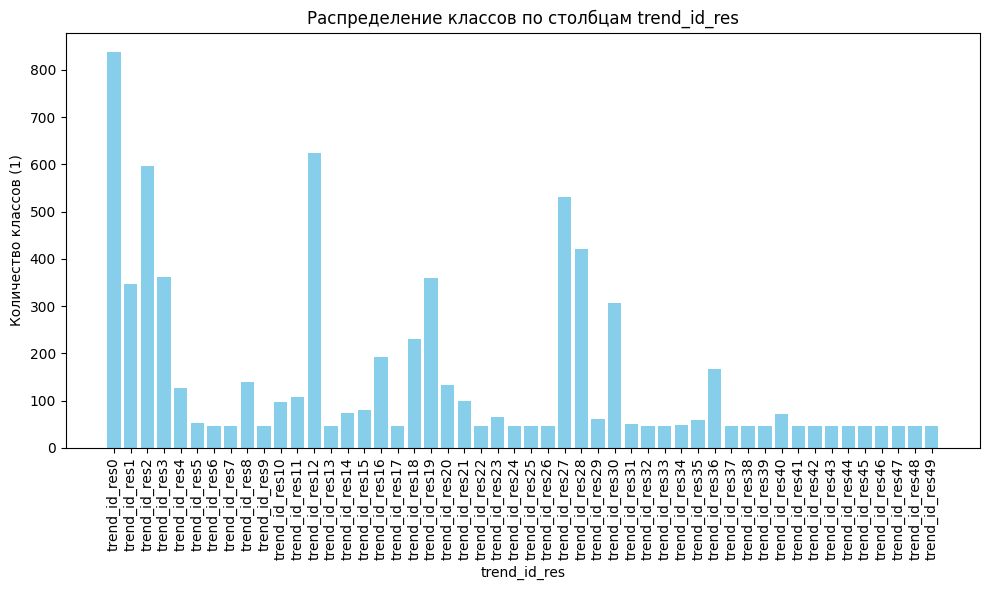

In [76]:
class_sums = train_data_augmented[targets_list].sum()

plt.figure(figsize=(10, 6))
plt.bar(class_sums.index, class_sums.values, color='skyblue')
plt.xticks(rotation=90)
plt.xlabel('trend_id_res')
plt.ylabel('Количество классов (1)')
plt.title('Распределение классов по столбцам trend_id_res')
plt.tight_layout()
plt.show()

Доля малочисленных классов выросла с 0.001 до 0.008892

In [94]:
#train_data_augmented.to_csv(os.path.join(PATH_COLAB, 'train_data_augmented_correct_spelling.csv'), index=False)

Финальная модель на leaderboard обучена на данных train_data_augmented_correct_spelling.csv.

Я также пробовала агументировать данные с помощью обратного перевода (использовала модель Helsinki-NLP/opus-mt-en-ru), но не хватило времени толком настроить модель классификации с этими данными. Поэтому сюда не включаю этот код, чтобы не засорять тетрадку.

# Спасибо за соревнование! Успешных Вам образовательных проектов и толковых кандидатов!